# Amazon Fine Food Reviews Analysis


Data Source: https://www.kaggle.com/snap/amazon-fine-food-reviews <br>

EDA: https://nycdatascience.com/blog/student-works/amazon-fine-foods-visualization/


The Amazon Fine Food Reviews dataset consists of reviews of fine foods from Amazon.<br>

Number of reviews: 568,454<br>
Number of users: 256,059<br>
Number of products: 74,258<br>
Timespan: Oct 1999 - Oct 2012<br>
Number of Attributes/Columns in data: 10 

Attribute Information:

1. Id
2. ProductId - unique identifier for the product
3. UserId - unqiue identifier for the user
4. ProfileName
5. HelpfulnessNumerator - number of users who found the review helpful
6. HelpfulnessDenominator - number of users who indicated whether they found the review helpful or not
7. Score - rating between 1 and 5
8. Time - timestamp for the review
9. Summary - brief summary of the review
10. Text - text of the review


#### Objective:
Given a review, determine whether the review is positive (rating of 4 or 5) or negative (rating of 1 or 2).

<br>
[Q] How to determine if a review is positive or negative?<br>
<br> 
[Ans] We could use Score/Rating. A rating of 4 or 5 can be cosnidered as a positive review. A rating of 1 or 2 can be considered as negative one. A review of rating 3 is considered nuetral and such reviews are ignored from our analysis. This is an approximate and proxy way of determining the polarity (positivity/negativity) of a review.




# [1]. Reading Data

## [1.1] Loading the data

The dataset is available in two forms
1. .csv file
2. SQLite Database

In order to load the data, We have used the SQLITE dataset as it is easier to query the data and visualise the data efficiently.
<br> 

Here as we only want to get the global sentiment of the recommendations (positive or negative), we will purposefully ignore all Scores equal to 3. If the score is above 3, then the recommendation wil be set to "positive". Otherwise, it will be set to "negative".

In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")


import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

In [2]:
# using SQLite Table to read data.
con = sqlite3.connect('database.sqlite') 

# filtering only positive and negative reviews i.e. 
# not taking into consideration those reviews with Score=3
# SELECT * FROM Reviews WHERE Score != 3 LIMIT 500000, will give top 500000 data points
# you can change the number to any other number based on your computing power

# filtered_data = pd.read_sql_query(""" SELECT * FROM Reviews WHERE Score != 3 LIMIT 500000""", con) 
# for tsne assignment you can take 5k data points

filtered_data = pd.read_sql_query(""" SELECT * FROM Reviews WHERE Score != 3""", con) 

# Give reviews with Score>3 a positive rating(1), and reviews with a score<3 a negative rating(0).
def partition(x):
    if x < 3:
        return 0
    return 1

#changing reviews with score less than 3 to be positive and vice-versa
actualScore = filtered_data['Score']
positiveNegative = actualScore.map(partition) 
filtered_data['Score'] = positiveNegative
print("Number of data points in our data", filtered_data.shape)
filtered_data.head(3)

Number of data points in our data (525814, 10)


,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,1,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,0,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,1,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...


In [3]:
display = pd.read_sql_query("""
SELECT UserId, ProductId, ProfileName, Time, Score, Text, COUNT(*)
FROM Reviews
GROUP BY UserId
HAVING COUNT(*)>1
""", con)

In [4]:
print(display.shape)
display.head()

(80668, 7)


,UserId,ProductId,ProfileName,Time,Score,Text,COUNT(*)
0,#oc-R115TNMSPFT9I7,B007Y59HVM,Breyton,1331510400,2,Overall its just OK when considering the price...,2
1,#oc-R11D9D7SHXIJB9,B005HG9ET0,"Louis E. Emory ""hoppy""",1342396800,5,"My wife has recurring extreme muscle spasms, u...",3
2,#oc-R11DNU2NBKQ23Z,B007Y59HVM,Kim Cieszykowski,1348531200,1,This coffee is horrible and unfortunately not ...,2
3,#oc-R11O5J5ZVQE25C,B005HG9ET0,Penguin Chick,1346889600,5,This will be the bottle that you grab from the...,3
4,#oc-R12KPBODL2B5ZD,B007OSBE1U,Christopher P. Presta,1348617600,1,I didnt like this coffee. Instead of telling y...,2


In [5]:
display[display['UserId']=='AZY10LLTJ71NX']

,UserId,ProductId,ProfileName,Time,Score,Text,COUNT(*)
80638,AZY10LLTJ71NX,B006P7E5ZI,"undertheshrine ""undertheshrine""",1334707200,5,I was recommended to try green tea extract to ...,5


In [6]:
display['COUNT(*)'].sum()

393063

#  [2] Exploratory Data Analysis

## [2.1] Data Cleaning: Deduplication

It is observed (as shown in the table below) that the reviews data had many duplicate entries. Hence it was necessary to remove duplicates in order to get unbiased results for the analysis of the data.  Following is an example:

In [7]:
display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND UserId="AR5J8UI46CURR"
ORDER BY ProductID
""", con)
display.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,78445,B000HDL1RQ,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
1,138317,B000HDOPYC,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
2,138277,B000HDOPYM,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
3,73791,B000HDOPZG,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
4,155049,B000PAQ75C,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...


As it can be seen above that same user has multiple reviews with same values for HelpfulnessNumerator, HelpfulnessDenominator, Score, Time, Summary and Text and on doing analysis it was found that <br>
<br> 
ProductId=B000HDOPZG was Loacker Quadratini Vanilla Wafer Cookies, 8.82-Ounce Packages (Pack of 8)<br>
<br> 
ProductId=B000HDL1RQ was Loacker Quadratini Lemon Wafer Cookies, 8.82-Ounce Packages (Pack of 8) and so on<br>

It was inferred after analysis that reviews with same parameters other than ProductId belonged to the same product just having different flavour or quantity. Hence in order to reduce redundancy it was decided to eliminate the rows having same parameters.<br>

The method used for the same was that we first sort the data according to ProductId and then just keep the first similar product review and delelte the others. for eg. in the above just the review for ProductId=B000HDL1RQ remains. This method ensures that there is only one representative for each product and deduplication without sorting would lead to possibility of different representatives still existing for the same product.

In [8]:
#Sorting data according to ProductId in ascending order
sorted_data=filtered_data.sort_values('ProductId', axis=0, ascending=True, inplace=False, kind='quicksort', na_position='last')

In [9]:
#Deduplication of entries
final=sorted_data.drop_duplicates(subset={"UserId","ProfileName","Time","Text"}, keep='first', inplace=False)
final.shape

(364173, 10)

In [10]:
#Checking to see how much % of data still remains
(final['Id'].size*1.0)/(filtered_data['Id'].size*1.0)*100

69.25890143662969

<b>Observation:-</b> It was also seen that in two rows given below the value of HelpfulnessNumerator is greater than HelpfulnessDenominator which is not practically possible hence these two rows too are removed from calcualtions

In [11]:
display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND Id=44737 OR Id=64422
ORDER BY ProductID
""", con)

display.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,64422,B000MIDROQ,A161DK06JJMCYF,"J. E. Stephens ""Jeanne""",3,1,5,1224892800,Bought This for My Son at College,My son loves spaghetti so I didn't hesitate or...
1,44737,B001EQ55RW,A2V0I904FH7ABY,Ram,3,2,4,1212883200,Pure cocoa taste with crunchy almonds inside,It was almost a 'love at first bite' - the per...


In [12]:
final=final[final.HelpfulnessNumerator<=final.HelpfulnessDenominator]

In [13]:
#Before starting the next phase of preprocessing lets see the number of entries left
print(final.shape)

#How many positive and negative reviews are present in our dataset?
final['Score'].value_counts()

(364171, 10)


1    307061
0     57110
Name: Score, dtype: int64

#  [3] Preprocessing

## [3.1].  Preprocessing Review Text

Now that we have finished deduplication our data requires some preprocessing before we go on further with analysis and making the prediction model.

Hence in the Preprocessing phase we do the following in the order below:-

1. Begin by removing the html tags
2. Remove any punctuations or limited set of special characters like , or . or # etc.
3. Check if the word is made up of english letters and is not alpha-numeric
4. Check to see if the length of the word is greater than 2 (as it was researched that there is no adjective in 2-letters)
5. Convert the word to lowercase
6. Remove Stopwords
7. Finally Snowball Stemming the word (it was obsereved to be better than Porter Stemming)<br>

After which we collect the words used to describe positive and negative reviews

In [14]:
# printing some random reviews
sent_0 = final['Text'].values[0]
print(sent_0)
print("="*50)

sent_1000 = final['Text'].values[1000]
print(sent_1000)
print("="*50)

sent_1500 = final['Text'].values[1500]
print(sent_1500)
print("="*50)

sent_4900 = final['Text'].values[4900]
print(sent_4900)
print("="*50)

this witty little book makes my son laugh at loud. i recite it in the car as we're driving along and he always can sing the refrain. he's learned about whales, India, drooping roses:  i love all the new words this book  introduces and the silliness of it all.  this is a classic book i am  willing to bet my son will STILL be able to recite from memory when he is  in college
I was really looking forward to these pods based on the reviews.  Starbucks is good, but I prefer bolder taste.... imagine my surprise when I ordered 2 boxes - both were expired! One expired back in 2005 for gosh sakes.  I admit that Amazon agreed to credit me for cost plus part of shipping, but geez, 2 years expired!!!  I'm hoping to find local San Diego area shoppe that carries pods so that I can try something different than starbucks.
Great ingredients although, chicken should have been 1st rather than chicken broth, the only thing I do not think belongs in it is Canola oil. Canola or rapeseed is not someting a do

In [15]:
# remove urls from text python: https://stackoverflow.com/a/40823105/4084039
sent_0 = re.sub(r"http\S+", "", sent_0)
sent_1000 = re.sub(r"http\S+", "", sent_1000)
sent_150 = re.sub(r"http\S+", "", sent_1500)
sent_4900 = re.sub(r"http\S+", "", sent_4900)

print(sent_0)

this witty little book makes my son laugh at loud. i recite it in the car as we're driving along and he always can sing the refrain. he's learned about whales, India, drooping roses:  i love all the new words this book  introduces and the silliness of it all.  this is a classic book i am  willing to bet my son will STILL be able to recite from memory when he is  in college


In [16]:
# https://stackoverflow.com/questions/16206380/python-beautifulsoup-how-to-remove-all-tags-from-an-element
from bs4 import BeautifulSoup

soup = BeautifulSoup(sent_0, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_1000, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_1500, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_4900, 'lxml')
text = soup.get_text()
print(text)

this witty little book makes my son laugh at loud. i recite it in the car as we're driving along and he always can sing the refrain. he's learned about whales, India, drooping roses:  i love all the new words this book  introduces and the silliness of it all.  this is a classic book i am  willing to bet my son will STILL be able to recite from memory when he is  in college
I was really looking forward to these pods based on the reviews.  Starbucks is good, but I prefer bolder taste.... imagine my surprise when I ordered 2 boxes - both were expired! One expired back in 2005 for gosh sakes.  I admit that Amazon agreed to credit me for cost plus part of shipping, but geez, 2 years expired!!!  I'm hoping to find local San Diego area shoppe that carries pods so that I can try something different than starbucks.
Great ingredients although, chicken should have been 1st rather than chicken broth, the only thing I do not think belongs in it is Canola oil. Canola or rapeseed is not someting a do

In [17]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [18]:
sent_1500 = decontracted(sent_1500)
print(sent_1500)
print("="*50)

Great ingredients although, chicken should have been 1st rather than chicken broth, the only thing I do not think belongs in it is Canola oil. Canola or rapeseed is not someting a dog would ever find in nature and if it did find rapeseed in nature and eat it, it would poison them. Today is Food industries have convinced the masses that Canola oil is a safe and even better oil than olive or virgin coconut, facts though say otherwise. Until the late 70 is it was poisonous until they figured out a way to fix that. I still like it but it could be better.


In [19]:
#remove words with numbers python: https://stackoverflow.com/a/18082370/4084039
sent_0 = re.sub("\S*\d\S*", "", sent_0).strip()
print(sent_0)

this witty little book makes my son laugh at loud. i recite it in the car as we're driving along and he always can sing the refrain. he's learned about whales, India, drooping roses:  i love all the new words this book  introduces and the silliness of it all.  this is a classic book i am  willing to bet my son will STILL be able to recite from memory when he is  in college


In [20]:
#remove spacial character: https://stackoverflow.com/a/5843547/4084039
sent_1500 = re.sub('[^A-Za-z0-9]+', ' ', sent_1500)
print(sent_1500)

Great ingredients although chicken should have been 1st rather than chicken broth the only thing I do not think belongs in it is Canola oil Canola or rapeseed is not someting a dog would ever find in nature and if it did find rapeseed in nature and eat it it would poison them Today is Food industries have convinced the masses that Canola oil is a safe and even better oil than olive or virgin coconut facts though say otherwise Until the late 70 is it was poisonous until they figured out a way to fix that I still like it but it could be better 


In [21]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
# <br /><br /> ==> after the above steps, we are getting "br br"
# we are including them into stop words list
# instead of <br /> if we have <br/> these tags would have revmoved in the 1st step

stopwords= set(['br', 'the', 'i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"])

In [22]:
# Combining all the above stundents 
from tqdm import tqdm
preprocessed_reviews = []
# tqdm is for printing the status bar
for sentance in tqdm(final['Text'].values):
    sentance = re.sub(r"http\S+", "", sentance)
    sentance = BeautifulSoup(sentance, 'lxml').get_text()
    sentance = decontracted(sentance)
    sentance = re.sub("\S*\d\S*", "", sentance).strip()
    sentance = re.sub('[^A-Za-z]+', ' ', sentance)
    # https://gist.github.com/sebleier/554280
    sentance = ' '.join(e.lower() for e in sentance.split() if e.lower() not in stopwords)
    preprocessed_reviews.append(sentance.strip())

100%|██████████| 364171/364171 [02:21<00:00, 2568.74it/s]


In [2]:
import pickle
preprocessed_reviews=pickle.load(open("preprocessed_reviews.pkl","rb"))

In [3]:
preprocessed_reviews[1500]

'great ingredients although chicken rather chicken broth thing not think belongs canola oil canola rapeseed not someting dog would ever find nature find rapeseed nature eat would poison today food industries convinced masses canola oil safe even better oil olive virgin coconut facts though say otherwise late poisonous figured way fix still like could better'

<h2><font color='red'>[3.2] Preprocessing Review Summary</font></h2>

In [3]:
## Similartly you can do preprocessing for review summary also.
X=np.array(preprocessed_reviews[:100000])
print(X.shape)
Xd=np.array(preprocessed_reviews[:5000])
Xd.shape

(100000,)


(5000,)

# [4] Featurization

## [4.1] BAG OF WORDS

## [4.2] Bi-Grams and n-Grams.

In [25]:
#bi-gram, tri-gram and n-gram

#removing stop words like "not" should be avoided before building n-grams
# count_vect = CountVectorizer(ngram_range=(1,2))
# please do read the CountVectorizer documentation http://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html

# you can choose these numebrs min_df=10, max_features=5000, of your choice
count_vect = CountVectorizer(ngram_range=(1,2), min_df=10, max_features=5000)
spbow = count_vect.fit_transform(X)
feat=count_vect.get_feature_names()
print("the type of count vectorizer ",type(spbow))
print("the shape of out text BOW vectorizer ",spbow.get_shape())
print("the number of unique words including both unigrams and bigrams ", spbow.get_shape()[1])

the type of count vectorizer  <class 'scipy.sparse.csr.csr_matrix'>
the shape of out text BOW vectorizer  (100000, 5000)
the number of unique words including both unigrams and bigrams  5000


In [26]:
count_vect = CountVectorizer(ngram_range=(1,2), min_df=10, max_features=3000)
spdbow = count_vect.fit_transform(Xd)
dfeat=count_vect.get_feature_names()
print("the type of count vectorizer ",type(spdbow))
print("the shape of out text BOW vectorizer ",spdbow.get_shape())
print("the number of unique words including both unigrams and bigrams ", spdbow.get_shape()[1])

the type of count vectorizer  <class 'scipy.sparse.csr.csr_matrix'>
the shape of out text BOW vectorizer  (5000, 3000)
the number of unique words including both unigrams and bigrams  3000


## [4.3] TF-IDF

In [27]:
tf_idf_vect = TfidfVectorizer(ngram_range=(1,2), min_df=10,max_features=5000)
tfidf=tf_idf_vect.fit_transform(X)
tfidffeat=tf_idf_vect.get_feature_names()
print("some sample features(unique words in the corpus)",tf_idf_vect.get_feature_names()[0:10])
print('='*50)
print("the type of count vectorizer ",type(tfidf))
print("the shape of out text TFIDF vectorizer ",tfidf.get_shape())
print("the number of unique words including both unigrams and bigrams ", tfidf.get_shape()[1])

some sample features(unique words in the corpus) ['ability', 'able', 'able buy', 'able eat', 'able find', 'able get', 'able order', 'absolute', 'absolute favorite', 'absolutely']
the type of count vectorizer  <class 'scipy.sparse.csr.csr_matrix'>
the shape of out text TFIDF vectorizer  (100000, 5000)
the number of unique words including both unigrams and bigrams  5000


In [28]:
tf_idf_vect = TfidfVectorizer(ngram_range=(1,2), min_df=10,max_features=3000)
tfidfd=tf_idf_vect.fit_transform(Xd)
dtfidffeat=tf_idf_vect.get_feature_names()
print("some sample features(unique words in the corpus)",tf_idf_vect.get_feature_names()[0:10])
print('='*50)
print("the type of count vectorizer ",type(tfidfd))
print("the shape of out text TFIDF vectorizer ",tfidfd.get_shape())
print("the number of unique words including both unigrams and bigrams ", tfidfd.get_shape()[1])

some sample features(unique words in the corpus) ['ability', 'able', 'able find', 'absolute', 'absolutely', 'absolutely love', 'absolutely loves', 'accident', 'according', 'acid']
the type of count vectorizer  <class 'scipy.sparse.csr.csr_matrix'>
the shape of out text TFIDF vectorizer  (5000, 3000)
the number of unique words including both unigrams and bigrams  3000


In [29]:
'''import pickle
pickle.dump(spbow,open("spbow.pkl","wb"))
pickle.dump(feat,open("feat.pkl","wb"))
pickle.dump(spdbow,open("spdbow.pkl","wb"))
pickle.dump(dfeat,open("dfeat.pkl","wb"))
pickle.dump(tfidf,open("tfidf.pkl","wb"))
pickle.dump(tfidffeat,open("tfidffeat.pkl","wb"))
pickle.dump(tfidfd,open("tfidfd.pkl","wb"))
pickle.dump(dtfidffeat,open("dtfidffeat.pkl","wb"))'''

In [5]:
import pickle
spbow=pickle.load(open("spbow.pkl","rb"))
feat=pickle.load(open("feat.pkl","rb"))
spdbow=pickle.load(open("spdbow.pkl","rb"))
dfeat=pickle.load(open("dfeat.pkl","rb"))
tfidf=pickle.load(open("tfidf.pkl","rb"))
tfidffeat=pickle.load(open("tfidffeat.pkl","rb"))
tfidfd=pickle.load(open("tfidfd.pkl","rb"))
dtfidffeat=pickle.load(open("dtfidffeat.pkl","rb"))

## [4.4] Word2Vec

In [7]:
# Train your own Word2Vec model using your own text corpus
i=0
list_of_sentance=[]
for sentance in X:
    list_of_sentance.append(sentance.split())

In [8]:
# Using Google News Word2Vectors

# in this project we are using a pretrained model by google
# its 3.3G file, once you load this into your memory 
# it occupies ~9Gb, so please do this step only if you have >12G of ram
# we will provide a pickle file wich contains a dict , 
# and it contains all our courpus words as keys and  model[word] as values
# To use this code-snippet, download "GoogleNews-vectors-negative300.bin" 
# from https://drive.google.com/file/d/0B7XkCwpI5KDYNlNUTTlSS21pQmM/edit
# it's 1.9GB in size.


# http://kavita-ganesan.com/gensim-word2vec-tutorial-starter-code/#.W17SRFAzZPY
# you can comment this whole cell
# or change these varible according to your need

is_your_ram_gt_16g=False
want_to_use_google_w2v = False
want_to_train_w2v = True

if want_to_train_w2v:
    # min_count = 5 considers only words that occured atleast 5 times
    w2v_model=Word2Vec(list_of_sentance,min_count=5,size=50, workers=4)
    print(w2v_model.wv.most_similar('great'))
    print('='*50)
    print(w2v_model.wv.most_similar('worst'))
    
elif want_to_use_google_w2v and is_your_ram_gt_16g:
    if os.path.isfile('GoogleNews-vectors-negative300.bin'):
        w2v_model=KeyedVectors.load_word2vec_format('GoogleNews-vectors-negative300.bin', binary=True)
        print(w2v_model.wv.most_similar('great'))
        print(w2v_model.wv.most_similar('worst'))
    else:
        print("you don't have gogole's word2vec file, keep want_to_train_w2v = True, to train your own w2v ")
        

[('terrific', 0.8551104664802551), ('awesome', 0.829035222530365), ('good', 0.8258086442947388), ('fantastic', 0.8201034665107727), ('excellent', 0.817619264125824), ('wonderful', 0.7838419675827026), ('perfect', 0.7775200605392456), ('amazing', 0.7157699465751648), ('fabulous', 0.7080274224281311), ('incredible', 0.7063198685646057)]
[('greatest', 0.7620819807052612), ('disgusting', 0.7252899408340454), ('best', 0.6991636157035828), ('nicest', 0.6464884877204895), ('nastiest', 0.6379787921905518), ('tastiest', 0.6225389838218689), ('terrible', 0.6099544167518616), ('horrible', 0.6027671694755554), ('yuck', 0.5992066264152527), ('horrid', 0.59742271900177)]


In [9]:
w2v_words = list(w2v_model.wv.vocab)
print("number of words that occured minimum 5 times ",len(w2v_words))
print("sample words ", w2v_words[0:50])

number of words that occured minimum 5 times  18840
sample words  ['germans', 'retired', 'tactic', 'everclear', 'shaping', 'anna', 'smearing', 'straw', 'plumbing', 'aiming', 'unprepared', 'deflated', 'distort', 'terribly', 'jade', 'articles', 'dente', 'wrapper', 'powerful', 'woke', 'arrangement', 'commendable', 'ik', 'unreal', 'rats', 'audience', 'gingivitis', 'everlasting', 'additions', 'surround', 'pears', 'kava', 'builders', 'noses', 'waste', 'looooong', 'offices', 'folding', 'ear', 'compensated', 'institution', 'starches', 'municipal', 'goood', 'superfine', 'accidents', 'pepperoni', 'satisfing', 'un', 'bakers']


## [4.4.1] Converting text into vectors using Avg W2V, TFIDF-W2V

#### [4.4.1.1] Avg W2v

In [16]:
# average Word2Vec
# compute average word2vec for each review.
avgw2v=[]; # the avg-w2v for each sentence/review is stored in this list
for sent in tqdm(list_of_sentance): # for each review/sentence
    sent_vec = np.zeros(50) # as word vectors are of zero length 50, you might need to change this to 300 if you use google's w2v
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
    if cnt_words != 0:
        sent_vec /= cnt_words
    avgw2v.append(sent_vec)
print(len(avgw2v))
print(len(avgw2v[0]))

100%|██████████| 100000/100000 [21:24<00:00, 77.85it/s]

100000
50


In [10]:
# Train your own Word2Vec model using your own text corpus
i=0
list_of_sentance=[]
for sentance in Xd:
    list_of_sentance.append(sentance.split())

In [11]:
# average Word2Vec
# compute average word2vec for each review.
davgw2v=[]; # the avg-w2v for each sentence/review is stored in this list
for sent in tqdm(list_of_sentance): # for each review/sentence
    sent_vec = np.zeros(50) # as word vectors are of zero length 50, you might need to change this to 300 if you use google's w2v
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
    if cnt_words != 0:
        sent_vec /= cnt_words
    davgw2v.append(sent_vec)
print(len(davgw2v))
print(len(davgw2v[0]))

100%|██████████| 5000/5000 [01:15<00:00, 66.33it/s] 

5000
50


In [19]:
'''import pickle
pickle.dump(avgw2v,open("avgw2v.pkl","wb"))
pickle.dump(w2v_words,open("w2v_words.pkl","wb"))'''

In [4]:
import pickle
avgw2v=pickle.load(open("avgw2v.pkl","rb"))
w2v_words=pickle.load(open("w2v_words.pkl","rb"))

#### [4.4.1.2] TFIDF weighted W2v

In [14]:
model = TfidfVectorizer()
tf_idf_matrix = model.fit_transform(X)
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(model.get_feature_names(), list(model.idf_)))

In [15]:
i=0
list_of_sentance=[]
for sentance in X:
    list_of_sentance.append(sentance.split())

In [16]:
# TF-IDF weighted Word2Vec
tfidf_feat = model.get_feature_names() # tfidf words/col-names
# final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf

tfidfw2v=[]; # the tfidf-w2v for each sentence/review is stored in this list
row=0;
for sent in tqdm(list_of_sentance): # for each review/sentence 
    sent_vec = np.zeros(50) # as word vectors are of zero length
    weight_sum =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words and word in tfidf_feat:
            vec = w2v_model.wv[word]
#             tf_idf = tf_idf_matrix[row, tfidf_feat.index(word)]
            # to reduce the computation we are 
            # dictionary[word] = idf value of word in whole courpus
            # sent.count(word) = tf valeus of word in this review
            tf_idf = dictionary[word]*(sent.count(word)/len(sent))
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf
    if weight_sum != 0:
        sent_vec /= weight_sum
    tfidfw2v.append(sent_vec)
    row += 1

100%|██████████| 100000/100000 [1:27:54<00:00, 18.96it/s] 


In [17]:
i=0
list_of_sentance=[]
for sentance in Xd:
    list_of_sentance.append(sentance.split())

In [18]:
# TF-IDF weighted Word2Vec
tfidf_feat = model.get_feature_names() # tfidf words/col-names
# final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf

dtfidfw2v=[]; # the tfidf-w2v for each sentence/review is stored in this list
row=0;
for sent in tqdm(list_of_sentance): # for each review/sentence 
    sent_vec = np.zeros(50) # as word vectors are of zero length
    weight_sum =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words and word in tfidf_feat:
            vec = w2v_model.wv[word]
#             tf_idf = tf_idf_matrix[row, tfidf_feat.index(word)]
            # to reduce the computation we are 
            # dictionary[word] = idf value of word in whole courpus
            # sent.count(word) = tf valeus of word in this review
            tf_idf = dictionary[word]*(sent.count(word)/len(sent))
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf
    if weight_sum != 0:
        sent_vec /= weight_sum
    dtfidfw2v.append(sent_vec)
    row += 1

100%|██████████| 5000/5000 [04:40<00:00, 17.81it/s]


In [19]:
'''import pickle
pickle.dump(tfidfw2v,open("tfidfw2v.pkl","wb"))
pickle.dump(tfidf_feat,open("tfidf_feat.pkl","wb"))
pickle.dump(dtfidfw2v,open("dtfidfw2v.pkl","wb"))'''

In [28]:
import pickle
tfidfw2v=pickle.load(open("tfidfw2v.pkl","rb"))
tfidf_feat=pickle.load(open("tfidf_feat.pkl","rb"))
dtfidfw2v=pickle.load(open("dtfidfw2v.pkl","rb"))

# [5] Assignment 10: K-Means, Agglomerative & DBSCAN Clustering

<ol>
    <li><strong>Apply K-means Clustering on these feature sets:</strong>
        <ul>
    <li><font color='red'>SET 1:</font>Review text, preprocessed one converted into vectors using (BOW)</li>
            <li><font color='red'>SET 2:</font>Review text, preprocessed one converted into vectors using (TFIDF)</li>
            <li><font color='red'>SET 3:</font>Review text, preprocessed one converted into vectors using (AVG W2v)</li>
            <li><font color='red'>SET 4:</font>Review text, preprocessed one converted into vectors using (TFIDF W2v)</li>
    <li>Find the best ‘k’ using the elbow-knee method (plot k vs inertia_)</li>
    <li>Once after you find the k clusters, plot the word cloud per each cluster so that at a single
go we can analyze the words in a cluster.</li>          
        </ul>
    </li>
    <br>
    <li><strong>Apply Agglomerative Clustering on these feature sets:</strong>
        <ul>
            <li><font color='red'>SET 3:</font>Review text, preprocessed one converted into vectors using (AVG W2v)</li>
            <li><font color='red'>SET 4:</font>Review text, preprocessed one converted into vectors using (TFIDF W2v)</li>
    <li>Apply agglomerative algorithm and try a different number of clusters like 2,5 etc.</li>
    <li>Same as that of K-means, plot word clouds for each cluster and summarize in your own words what that cluster is representing.</li>
            <li>You can take around 5000 reviews or so(as this is very computationally expensive one)</li>
        </ul>
    </li>
    <br>
    <br>
    <li><strong>Apply DBSCAN Clustering on these feature sets:</strong>
        <ul>
            <li><font color='red'>SET 3:</font>Review text, preprocessed one converted into vectors using (AVG W2v)</li>
            <li><font color='red'>SET 4:</font>Review text, preprocessed one converted into vectors using (TFIDF W2v)</li>
    <li>Find the best ‘Eps’ using the <a href='https://stackoverflow.com/questions/12893492/choosing-eps-and-minpts-for-dbscan-r/48558030#48558030'>elbow-knee method.</a></li>
    <li>Same as before, plot word clouds for each cluster and summarize in your own words what that cluster is representing.</li>
            <li>You can take around 5000 reviews for this as well.</li>
        </ul>
    </li>
</ol>

## [5.1] K-Means Clustering

### [5.1.1] Applying K-Means Clustering on BOW,<font color='red'> SET 1</font>

In [34]:
# Please write all the code with proper documentation
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
iner=[]
k=list(range(1,11))
for i in k:
    km=KMeans(n_clusters=i,n_jobs=-1)
    km.fit(spbow)
    iner.append(km.inertia_)

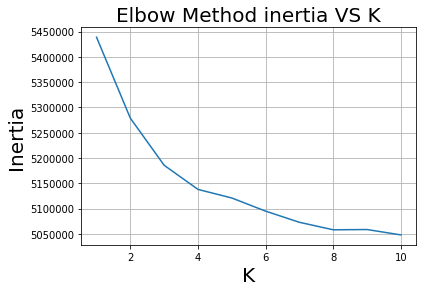

In [35]:
plt.plot(k,iner)
plt.title("Elbow Method inertia VS K",size=20)
plt.xlabel("K",size=20)
plt.ylabel("Inertia",size=20)
plt.grid()
plt.show()    

In [39]:
km=KMeans(n_clusters=3,n_jobs=-1)
km.fit(spbow)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=3, n_init=10, n_jobs=-1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

### [5.1.2] Wordclouds of clusters obtained after applying k-means on BOW<font color='red'> SET 1</font>

In [40]:
# Please write all the code with proper documentation
c1=[]
c2=[]
c2=[]
c3=[]
reviewcount=km.labels_.shape[0]
for i in range(reviewcount):
    l=km.labels_[i]
    if l==0:
        c1.append(preprocessed_reviews[i])
    elif l==1:
        c2.append(preprocessed_reviews[i])
    else:
        c3.append(preprocessed_reviews[i])

In [48]:
print("reviews in Cluster 1 : ",len(c1))
print("reviews in Cluster 2 : ",len(c2))
print("reviews in Cluster 3 : ",len(c3))

reviews in Cluster 1 :  81836
reviews in Cluster 2 :  15010
reviews in Cluster 3 :  3154


In [5]:
#https://github.com/amueller/word_cloud refrence taken for wordcloud
from wordcloud import WordCloud
def wordcloud(l):
    s1=''.join(l)
    str=re.compile('\w+').findall(s1)
    c=set();
    for i in str:
        c.add(i)
    l=len(c)
    uw=[]
    for i in range(l):
        uw.append(c.pop())
    us=(" ").join(uw)
    wc=WordCloud(width=1000,height=600,background_color='black').generate(us)
    plt.figure(figsize=(25, 20))
    plt.figure(figsize = (25, 20))
    plt.imshow(wc) 
    plt.axis("off")
    plt.savefig("Wordcloud"+".png",bbox_inches='tight')
    plt.show()
    plt.close()

<Figure size 1800x1440 with 0 Axes>

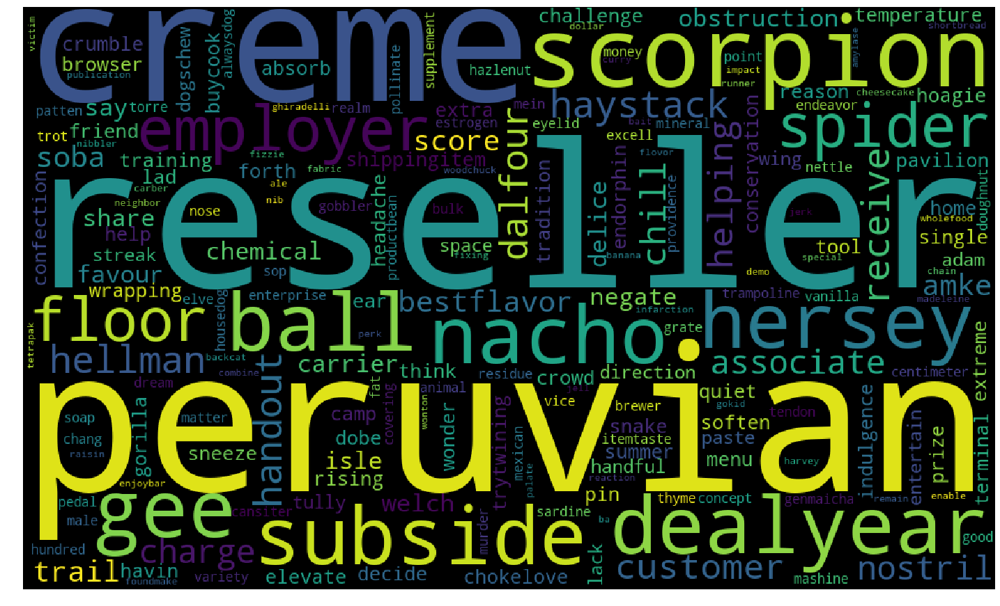

In [43]:
wordcloud(c1)

<Figure size 1800x1440 with 0 Axes>

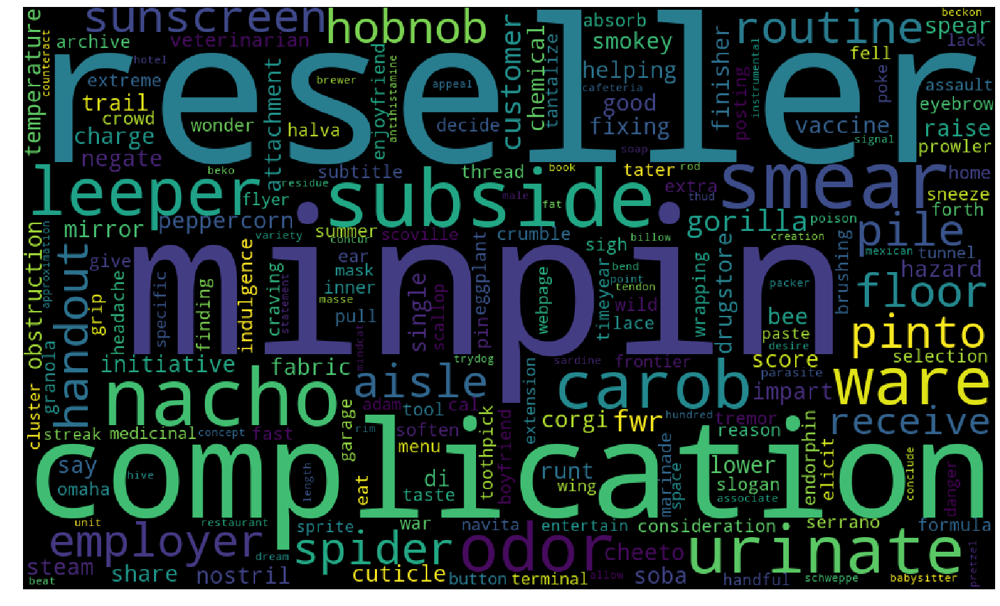

In [44]:
wordcloud(c2)

<Figure size 1800x1440 with 0 Axes>

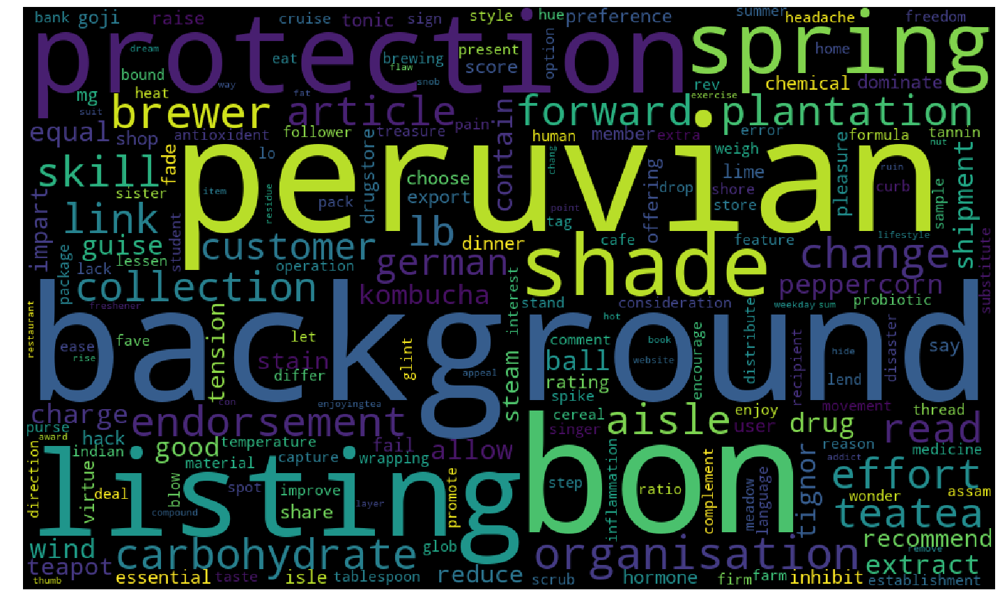

In [45]:
wordcloud(c3)

### [5.1.3] Applying K-Means Clustering on TFIDF,<font color='red'> SET 2</font>

In [46]:
# Please write all the code with proper documentation
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
iner=[]
k=list(range(1,11))
for i in k:
    km=KMeans(n_clusters=i,n_jobs=-1)
    km.fit(tfidf)
    iner.append(km.inertia_)

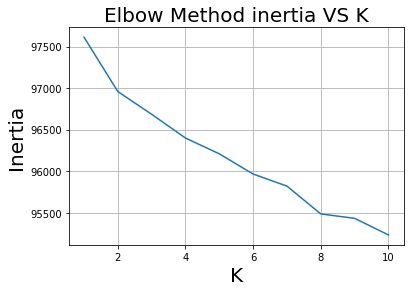

In [47]:
plt.plot(k,iner)
plt.title("Elbow Method inertia VS K",size=20)
plt.xlabel("K",size=20)
plt.ylabel("Inertia",size=20)
plt.grid()
plt.show()  

In [49]:
km=KMeans(n_clusters=8,n_jobs=-1)
km.fit(tfidf)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=8, n_init=10, n_jobs=-1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [50]:
c1=[]
c2=[]
c2=[]
c3=[]
c4=[]
c5=[]
c6=[]
c7=[]
c8=[]
reviewcount=km.labels_.shape[0]
for i in range(reviewcount):
    l=km.labels_[i]
    if l==0:
        c1.append(preprocessed_reviews[i])
    elif l==1:
        c2.append(preprocessed_reviews[i])
    elif l==2:
        c3.append(preprocessed_reviews[i])
    elif l==3:
        c4.append(preprocessed_reviews[i])
    elif l==4:
        c5.append(preprocessed_reviews[i])
    elif l==5:
        c6.append(preprocessed_reviews[i])
    elif l==6:
        c7.append(preprocessed_reviews[i])    
    else:
        c8.append(preprocessed_reviews[i])

In [51]:
print("reviews in Cluster 1 : ",len(c1))
print("reviews in Cluster 2 : ",len(c2))
print("reviews in Cluster 3 : ",len(c3))
print("reviews in Cluster 4 : ",len(c4))
print("reviews in Cluster 5 : ",len(c5))
print("reviews in Cluster 6 : ",len(c6))
print("reviews in Cluster 7 : ",len(c7))
print("reviews in Cluster 8 : ",len(c8))

reviews in Cluster 1 :  9733
reviews in Cluster 2 :  7501
reviews in Cluster 3 :  3538
reviews in Cluster 4 :  8575
reviews in Cluster 5 :  38805
reviews in Cluster 6 :  19274
reviews in Cluster 7 :  2992
reviews in Cluster 8 :  9582


### [5.1.4] Wordclouds of clusters obtained after applying k-means on TFIDF<font color='red'> SET 2</font>

<Figure size 1800x1440 with 0 Axes>

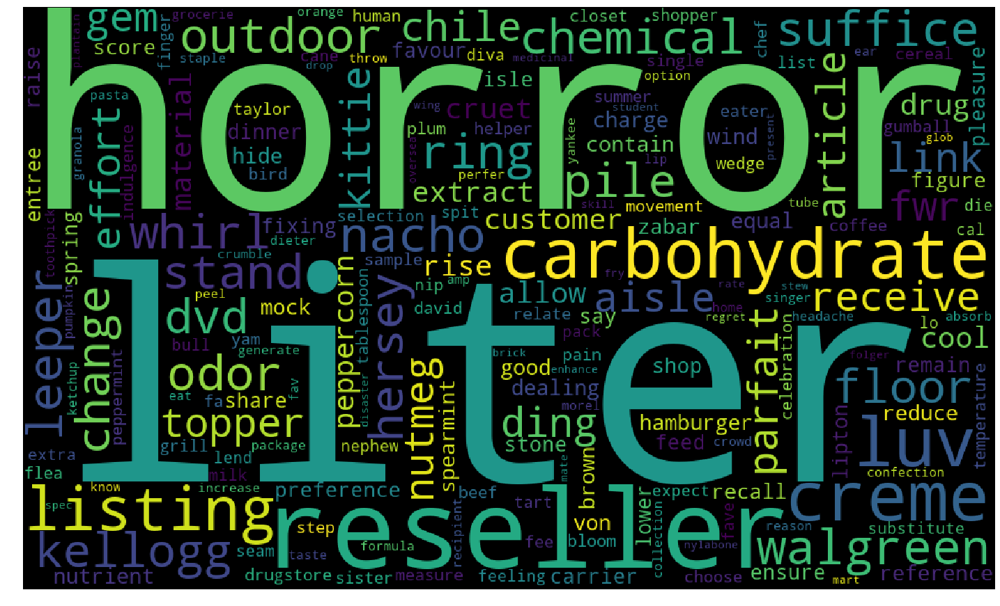

In [58]:
wordcloud(c1)

<Figure size 1800x1440 with 0 Axes>

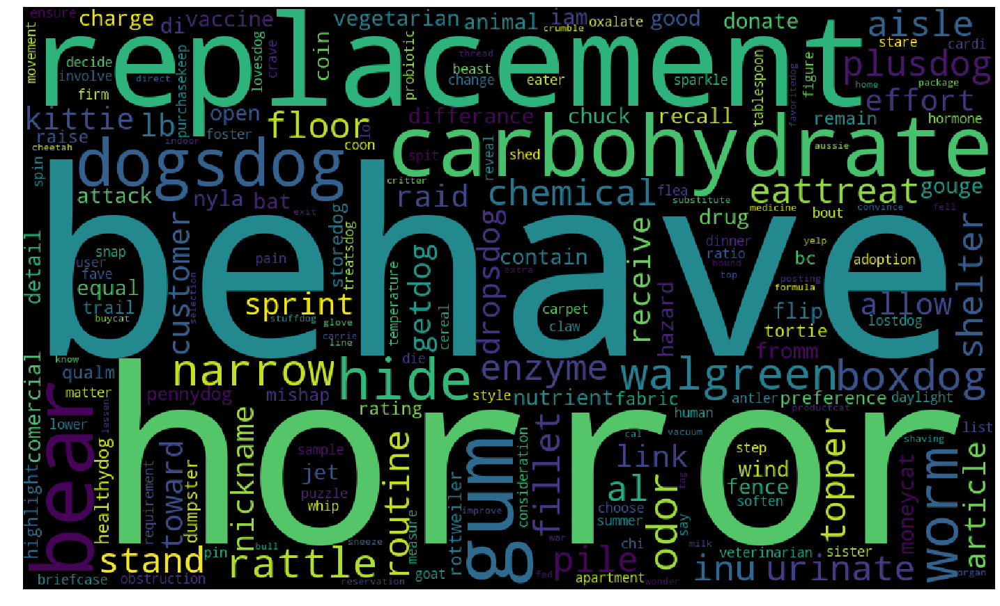

In [59]:
wordcloud(c2)

<Figure size 1800x1440 with 0 Axes>

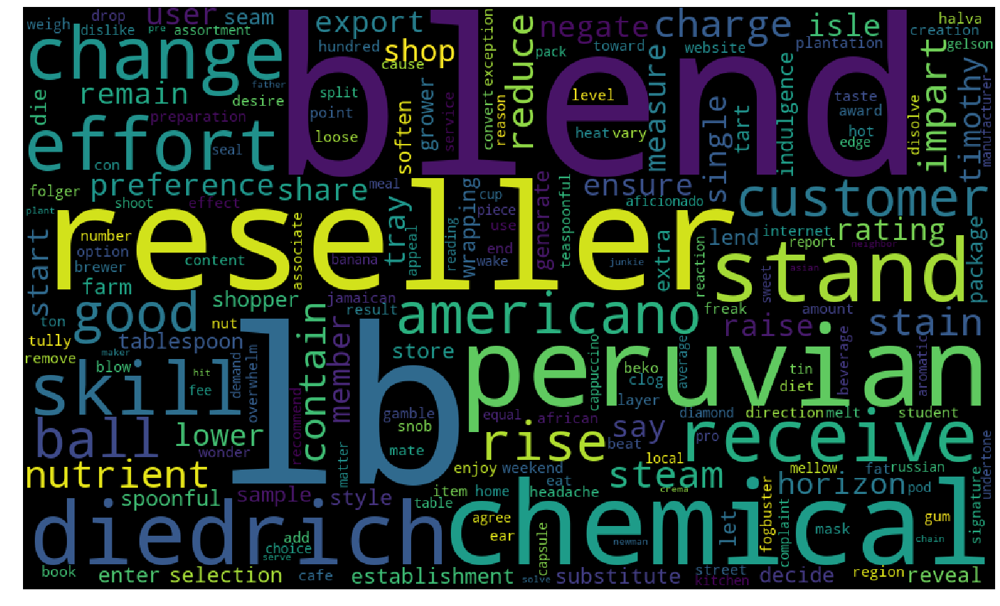

In [60]:
wordcloud(c3)

<Figure size 1800x1440 with 0 Axes>

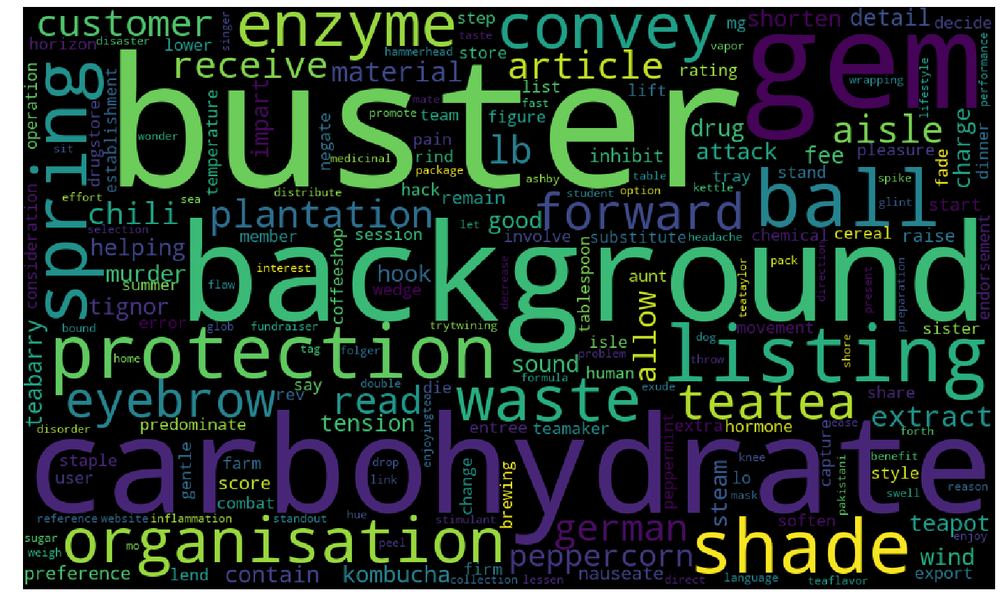

In [61]:
wordcloud(c4)

<Figure size 1800x1440 with 0 Axes>

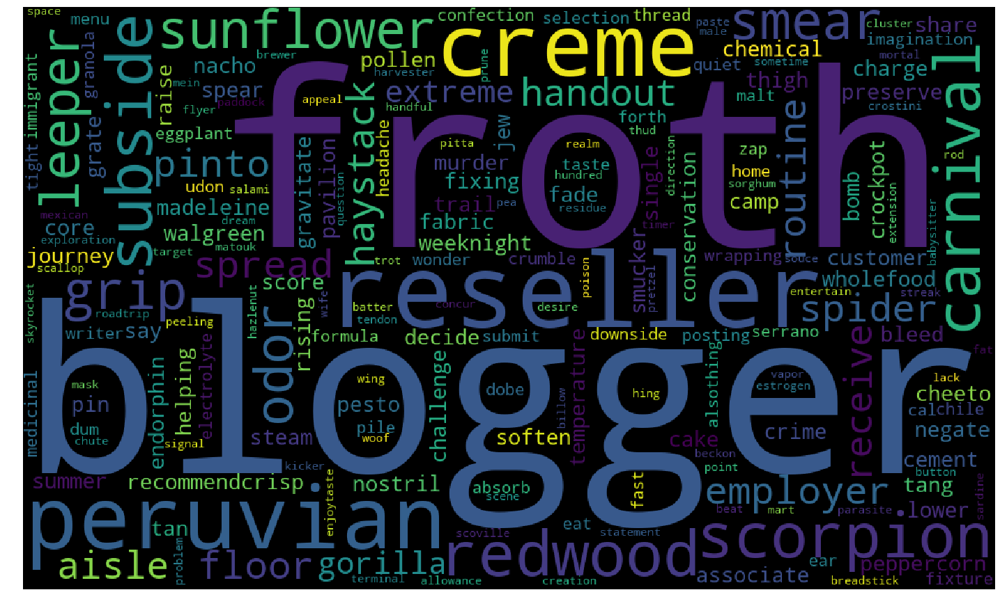

In [62]:
wordcloud(c5)

<Figure size 1800x1440 with 0 Axes>

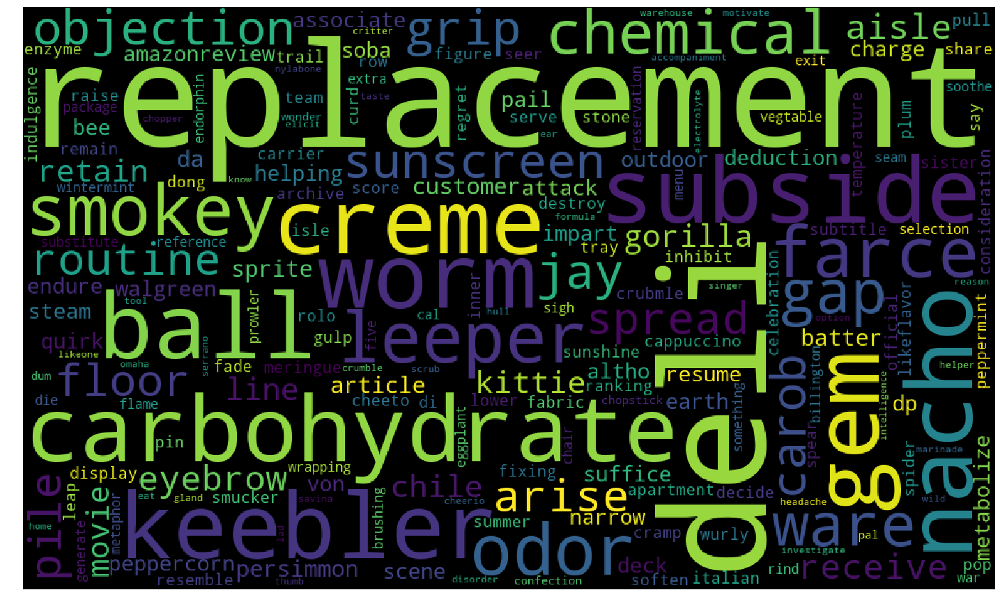

In [63]:
wordcloud(c6)

<Figure size 1800x1440 with 0 Axes>

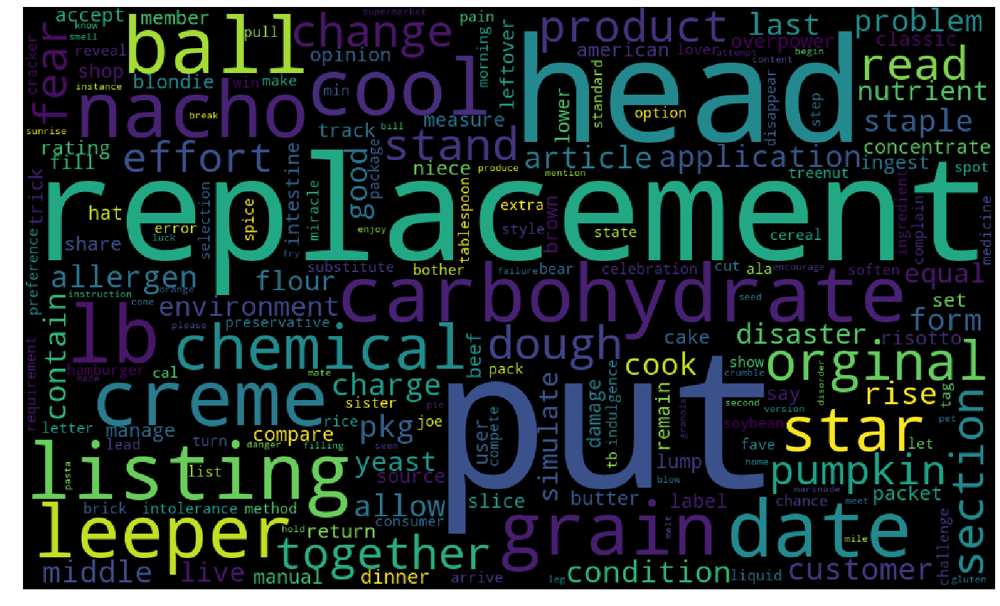

In [64]:
wordcloud(c7)

<Figure size 1800x1440 with 0 Axes>

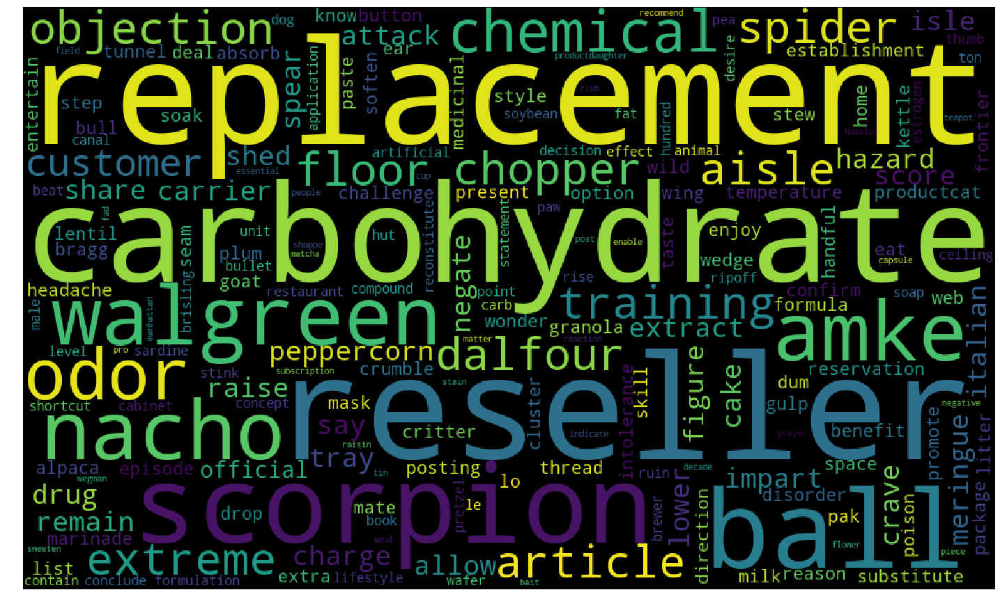

In [65]:
wordcloud(c8)

### [5.1.5] Applying K-Means Clustering on AVG W2V,<font color='red'> SET 3</font>

In [ ]:
# Please write all the code with proper documentation
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
iner=[]
k=list(range(1,11))
for i in k:
    km=KMeans(n_clusters=i)
    km.fit(avgw2v)
    iner.append(km.inertia_)

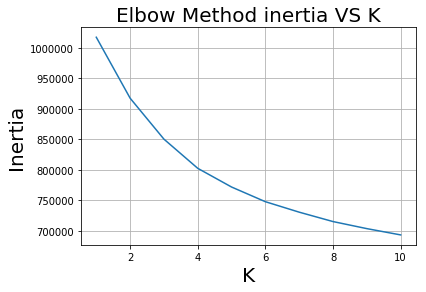

In [8]:
plt.plot(k,iner)
plt.title("Elbow Method inertia VS K",size=20)
plt.xlabel("K",size=20)
plt.ylabel("Inertia",size=20)
plt.grid()
plt.show()  

## optimal k=4

In [ ]:
km=KMeans(n_clusters=4,n_jobs=-1)
km.fit(avgw2v)

In [16]:
c1=[]
c2=[]
c3=[]
c4=[]
reviewcount=km.labels_.shape[0]
for i in range(reviewcount):
    l=km.labels_[i]
    if l==0:
        c1.append(preprocessed_reviews[i])
    elif l==1:
        c2.append(preprocessed_reviews[i])
    elif l==2:
        c3.append(preprocessed_reviews[i])
    else:
        c4.append(preprocessed_reviews[i])

In [17]:
print("reviews in Cluster 1 : ",len(c1))
print("reviews in Cluster 2 : ",len(c2))
print("reviews in Cluster 3 : ",len(c3))
print("reviews in Cluster 4 : ",len(c4))

reviews in Cluster 1 :  41192
reviews in Cluster 2 :  23878
reviews in Cluster 3 :  21484
reviews in Cluster 4 :  13446


### [5.1.6] Wordclouds of clusters obtained after applying k-means on AVG W2V<font color='red'> SET 3</font>

<Figure size 1800x1440 with 0 Axes>

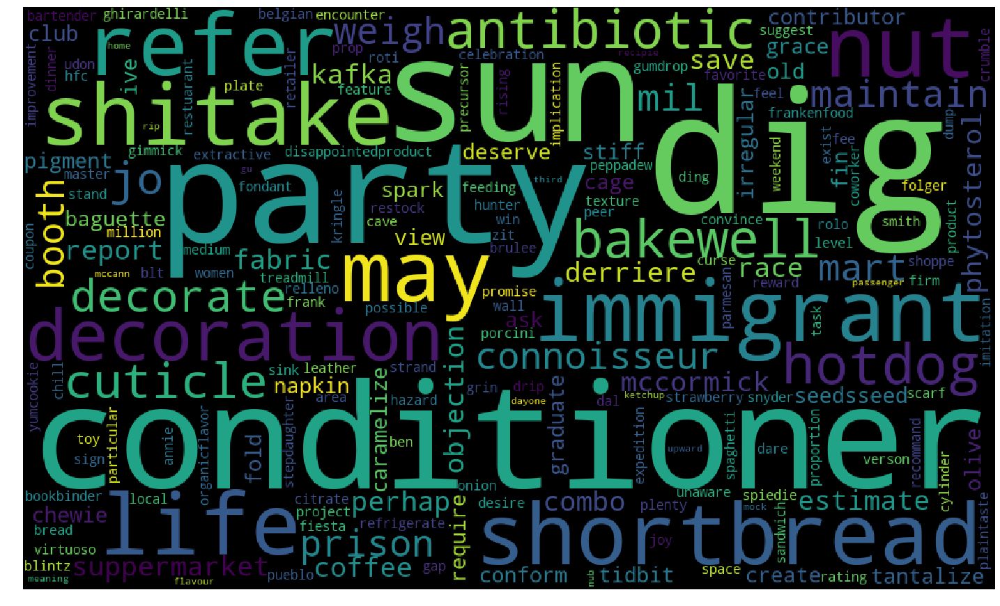

In [18]:
# Please write all the code with proper documentation
wordcloud(c1)

<Figure size 1800x1440 with 0 Axes>

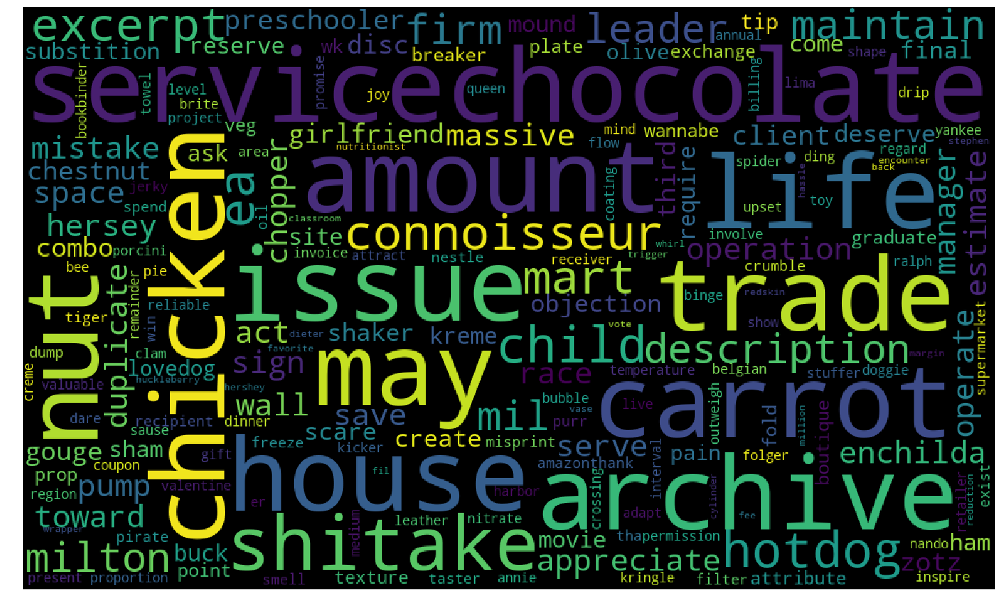

In [19]:
wordcloud(c2)

<Figure size 1800x1440 with 0 Axes>

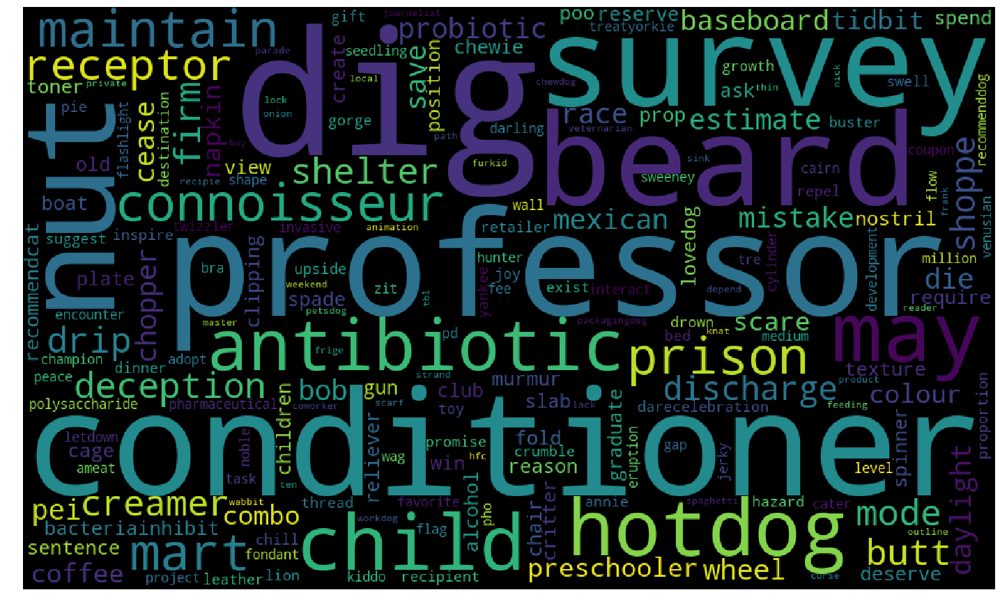

In [20]:
wordcloud(c3)

<Figure size 1800x1440 with 0 Axes>

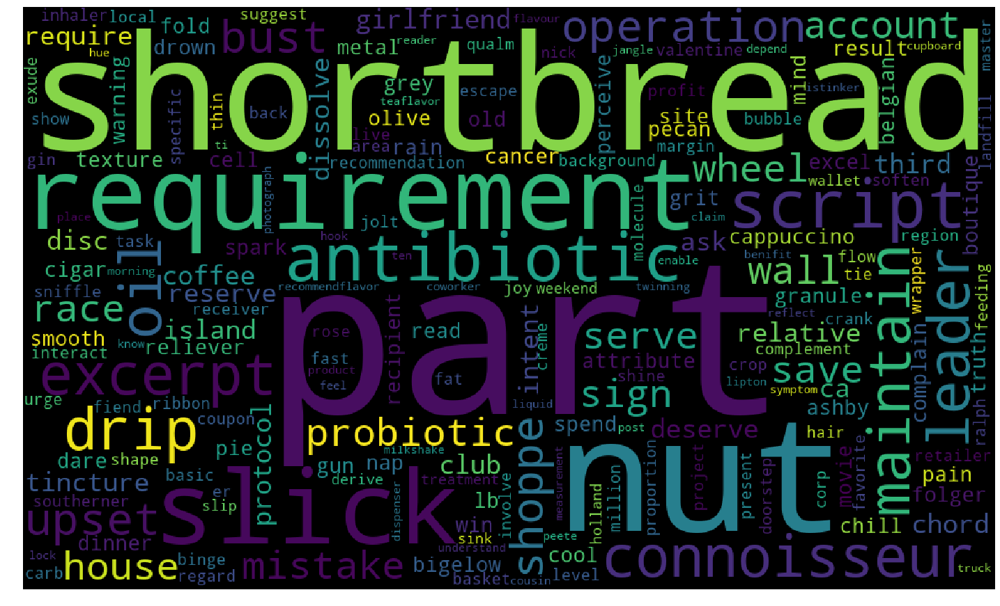

In [21]:
wordcloud(c4)

### [5.1.7] Applying K-Means Clustering on TFIDF W2V,<font color='red'> SET 4</font>

In [3]:
# Please write all the code with proper documentation
# Please write all the code with proper documentation
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
iner=[]
k=list(range(1,11))
for i in k:
    km=KMeans(n_clusters=i)
    km.fit(tfidfw2v)
    iner.append(km.inertia_)

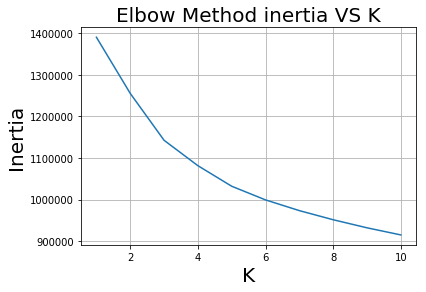

In [23]:
plt.plot(k,iner)
plt.title("Elbow Method inertia VS K",size=20)
plt.xlabel("K",size=20)
plt.ylabel("Inertia",size=20)
plt.grid()
plt.show()  

## optimal K=3

In [29]:
from sklearn.cluster import KMeans
km=KMeans(n_clusters=3,n_jobs=-1)
km.fit(tfidfw2v)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=3, n_init=10, n_jobs=-1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [30]:
c1=[]
c2=[]
c3=[]
reviewcount=km.labels_.shape[0]
for i in range(reviewcount):
    l=km.labels_[i]
    if l==0:
        c1.append(preprocessed_reviews[i])
    elif l==1:
        c2.append(preprocessed_reviews[i])
    else:
        c3.append(preprocessed_reviews[i])

In [31]:
print("reviews in Cluster 1 : ",len(c1))
print("reviews in Cluster 2 : ",len(c2))
print("reviews in Cluster 3 : ",len(c3))

reviews in Cluster 1 :  44587
reviews in Cluster 2 :  12798
reviews in Cluster 3 :  42615


### [5.1.8] Wordclouds of clusters obtained after applying k-means on TFIDF W2V<font color='red'> SET 4</font>

<Figure size 1800x1440 with 0 Axes>

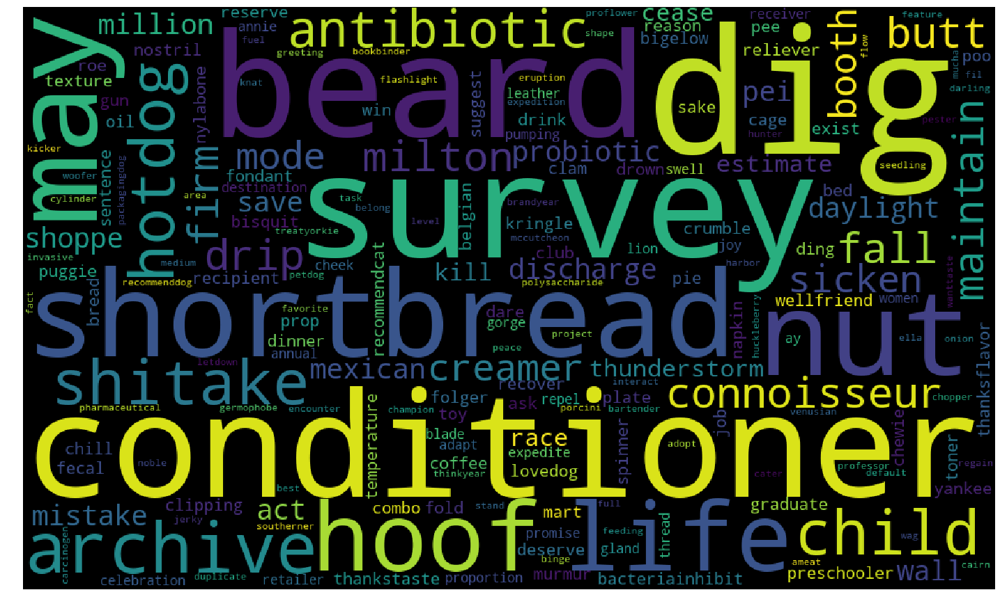

In [32]:
# Please write all the code with proper documentation
wordcloud(c1)

<Figure size 1800x1440 with 0 Axes>

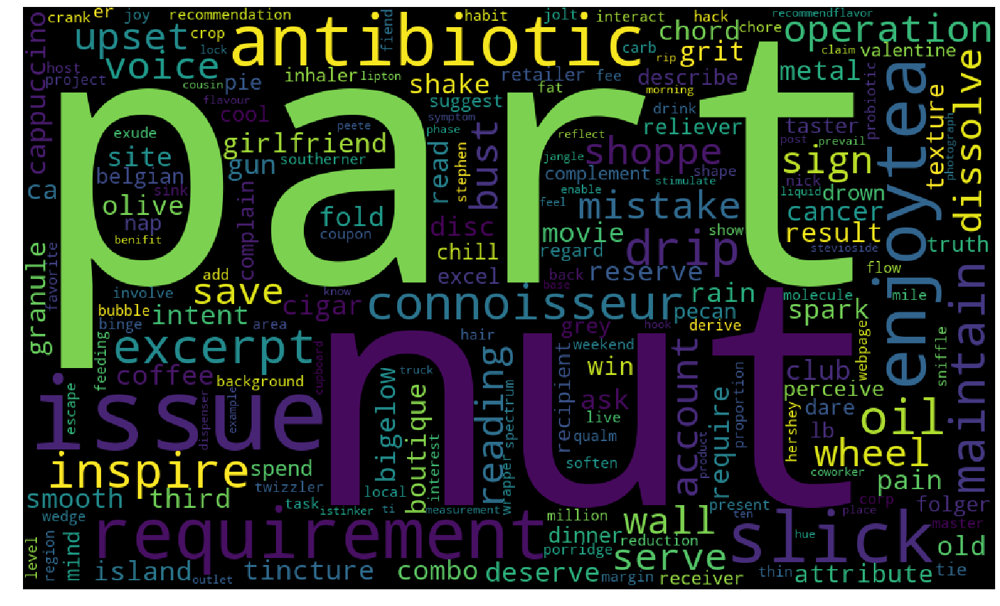

In [33]:
wordcloud(c2)

<Figure size 1800x1440 with 0 Axes>

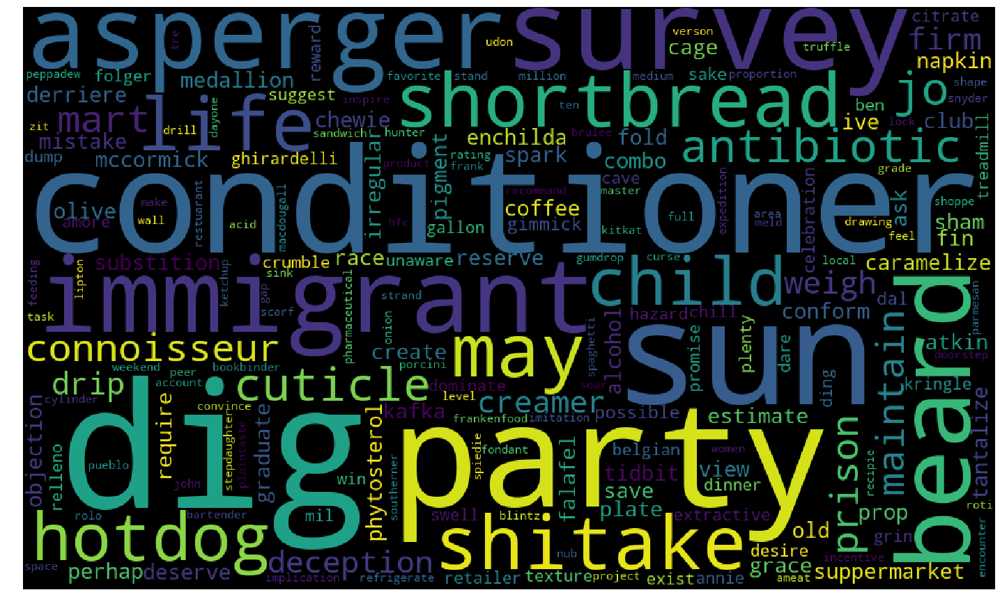

In [34]:
wordcloud(c3)

## [5.2] Agglomerative Clustering

### [5.2.1] Applying Agglomerative Clustering on AVG W2V,<font color='red'> SET 3</font>

### Cluster size=2

In [13]:
# Please write all the code with proper 
from sklearn.cluster import AgglomerativeClustering
agg=AgglomerativeClustering(n_clusters=2)
agg.fit(davgw2v)

AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
            connectivity=None, linkage='ward', memory=None, n_clusters=2,
            pooling_func=<function mean at 0x7f03800ccc80>)

In [15]:
c1=[]
c2=[]
reviewcount=agg.labels_.shape[0]
for i in range(reviewcount):
    l=agg.labels_[i]
    if l==0:
        c1.append(preprocessed_reviews[i])
    else:
        c2.append(preprocessed_reviews[i])

In [16]:
print("reviews in Cluster 1 : ",len(c1))
print("reviews in Cluster 2 : ",len(c2))

reviews in Cluster 1 :  3063
reviews in Cluster 2 :  1937


### Word Cloud on cluster size = 2

<Figure size 1800x1440 with 0 Axes>

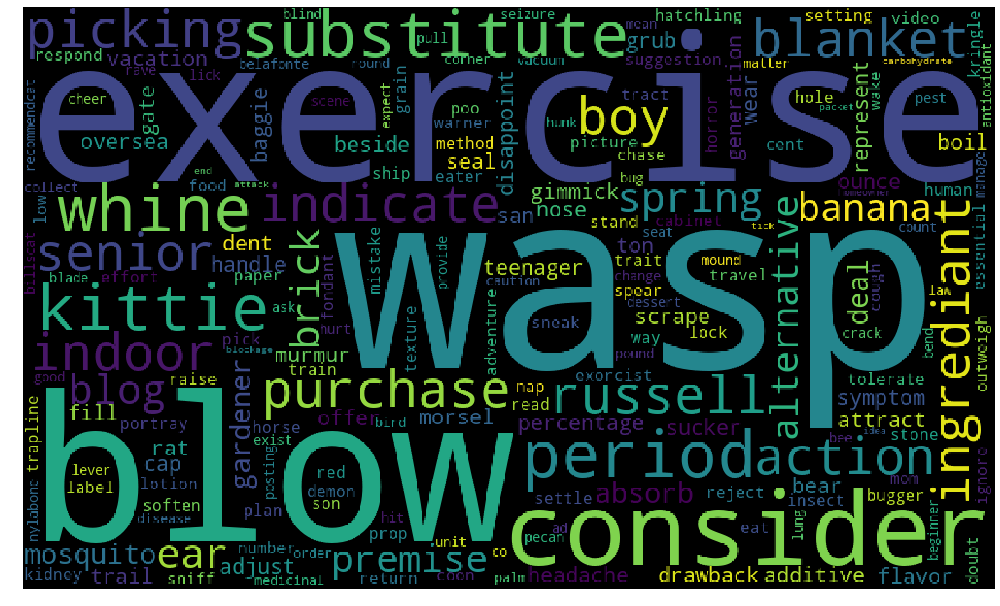

In [18]:
wordcloud(c1)

<Figure size 1800x1440 with 0 Axes>

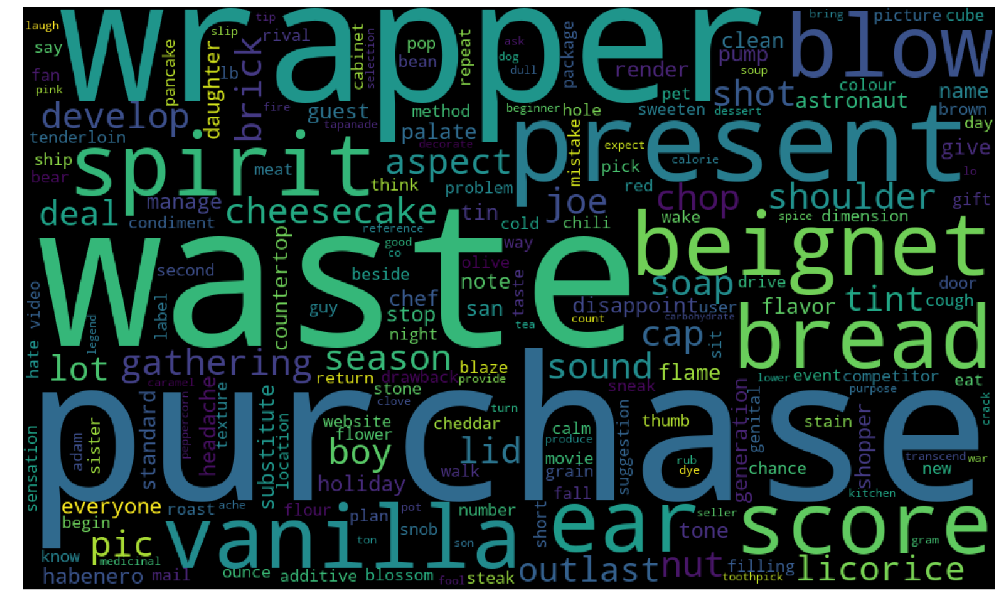

In [19]:
wordcloud(c2)

### cluster size=5

In [20]:
from sklearn.cluster import AgglomerativeClustering
agg=AgglomerativeClustering(n_clusters=5)
agg.fit(davgw2v)

AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
            connectivity=None, linkage='ward', memory=None, n_clusters=5,
            pooling_func=<function mean at 0x7f03800ccc80>)

In [21]:
c1=[]
c2=[]
c3=[]
c4=[]
c5=[]
reviewcount=agg.labels_.shape[0]
for i in range(reviewcount):
    l=agg.labels_[i]
    if l==0:
        c1.append(preprocessed_reviews[i])
    elif l==1:
        c2.append(preprocessed_reviews[i])
    elif l==2:
        c3.append(preprocessed_reviews[i])
    elif l==3:
        c4.append(preprocessed_reviews[i])    
    else:
        c5.append(preprocessed_reviews[i])

In [22]:
print("reviews in Cluster 1 : ",len(c1))
print("reviews in Cluster 2 : ",len(c2))
print("reviews in Cluster 3 : ",len(c3))
print("reviews in Cluster 4 : ",len(c4))
print("reviews in Cluster 5 : ",len(c5))

reviews in Cluster 1 :  1596
reviews in Cluster 2 :  1110
reviews in Cluster 3 :  1179
reviews in Cluster 4 :  341
reviews in Cluster 5 :  774


### Word cloud cluster=5

<Figure size 1800x1440 with 0 Axes>

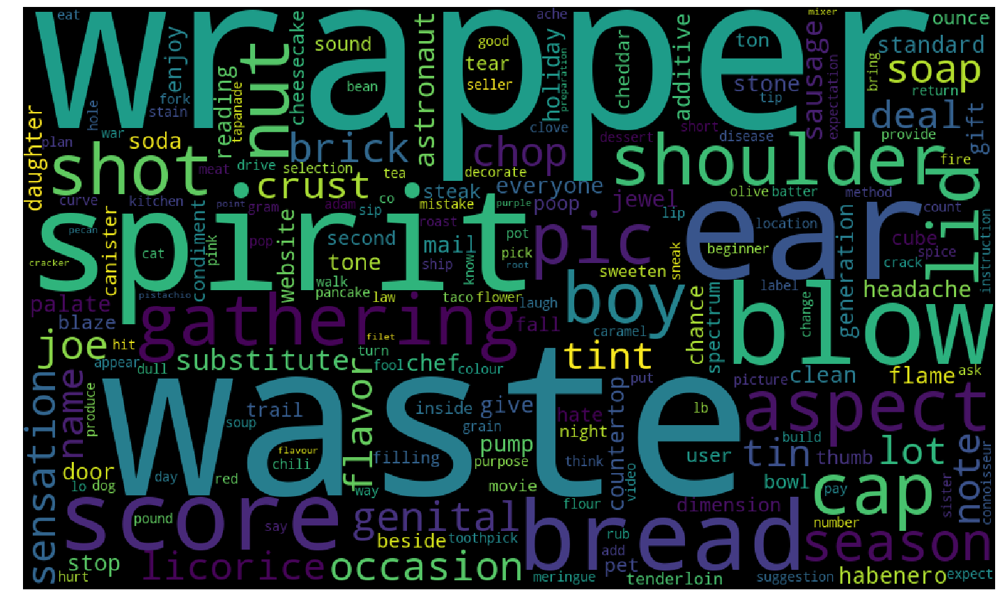

In [23]:
wordcloud(c1)

<Figure size 1800x1440 with 0 Axes>

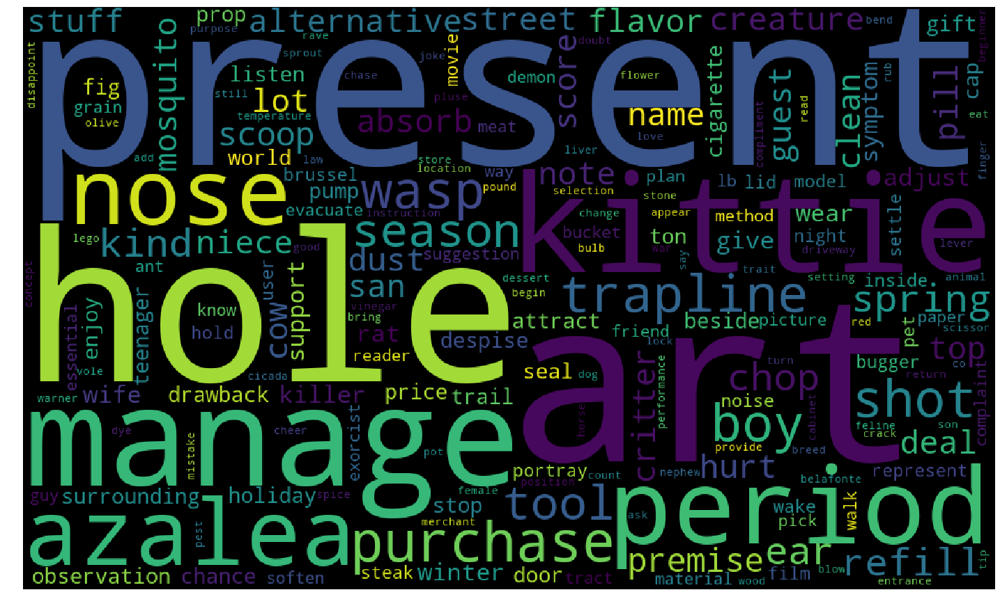

In [24]:
wordcloud(c2)

<Figure size 1800x1440 with 0 Axes>

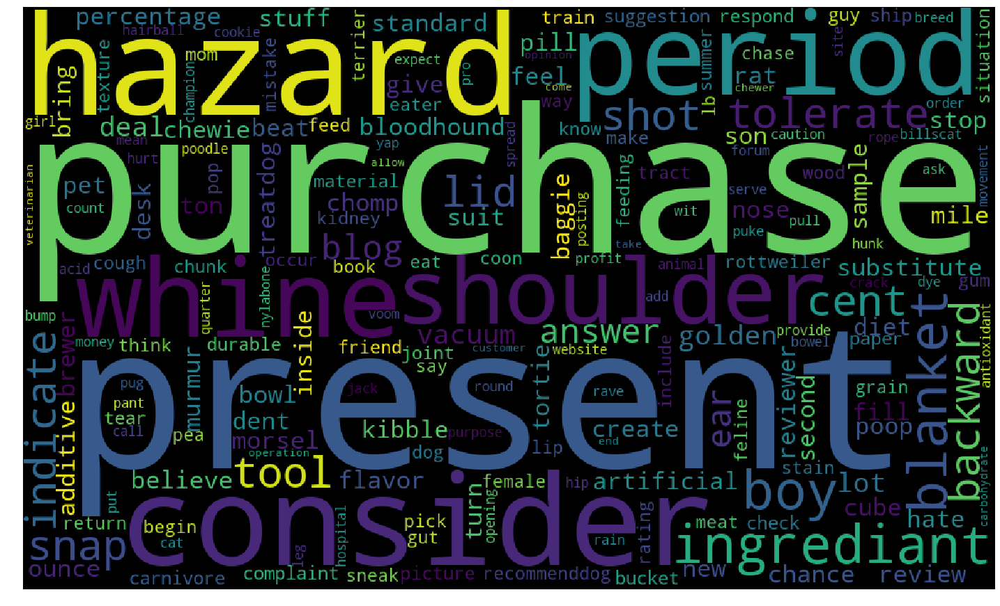

In [25]:
wordcloud(c3)

<Figure size 1800x1440 with 0 Axes>

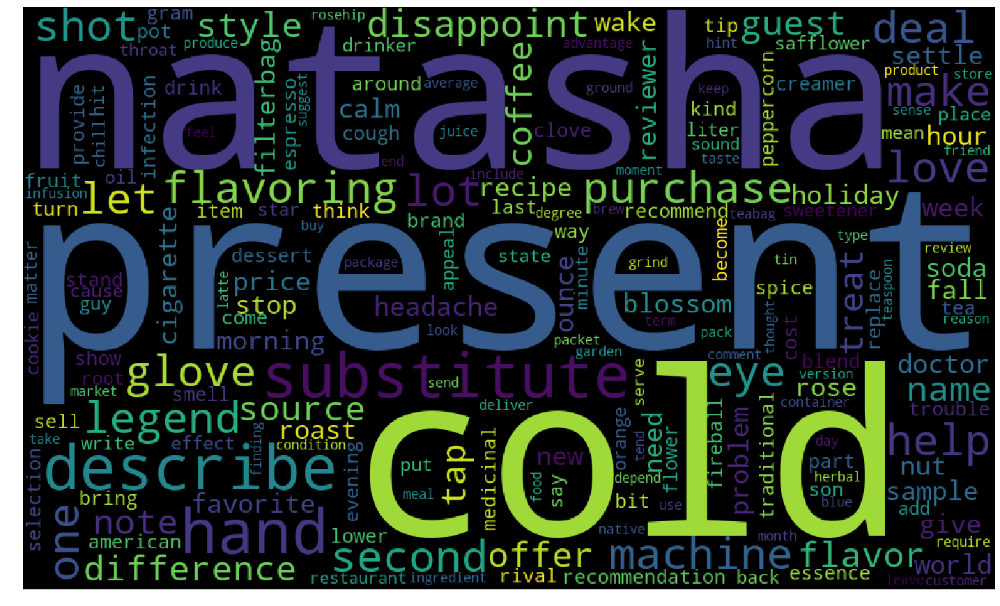

In [26]:
wordcloud(c4)

<Figure size 1800x1440 with 0 Axes>

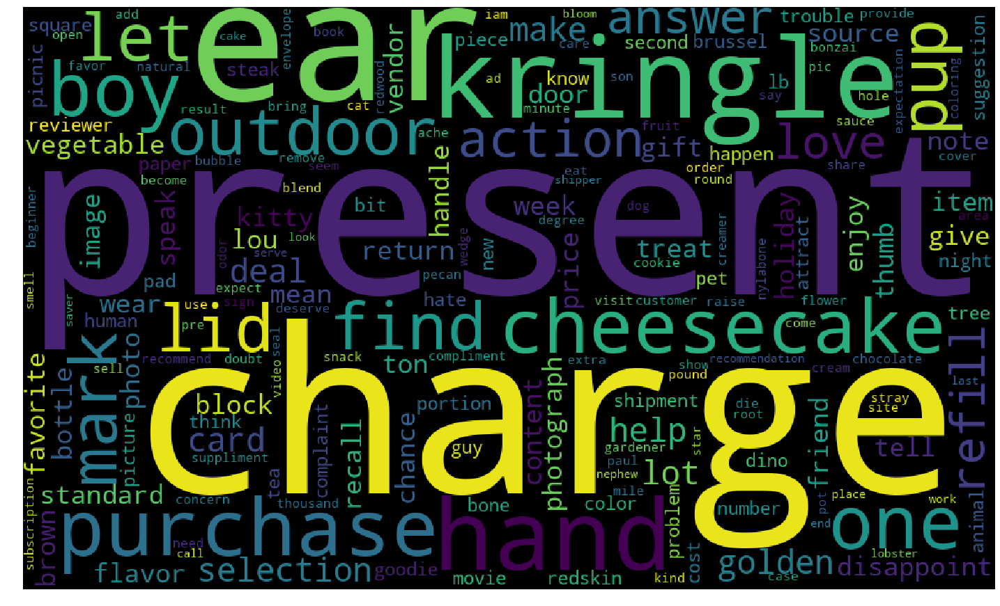

In [27]:
wordcloud(c5)

### [5.2.3] Applying Agglomerative Clustering on TFIDF W2V,<font color='red'> SET 4</font>

## n_cluster=2

In [29]:
# Please write all the code with proper documentation
from sklearn.cluster import AgglomerativeClustering
agg=AgglomerativeClustering(n_clusters=2)
agg.fit(dtfidfw2v)

AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
            connectivity=None, linkage='ward', memory=None, n_clusters=2,
            pooling_func=<function mean at 0x7f03800ccc80>)

In [30]:
c1=[]
c2=[]
reviewcount=agg.labels_.shape[0]
for i in range(reviewcount):
    l=agg.labels_[i]
    if l==0:
        c1.append(preprocessed_reviews[i])
    else:
        c2.append(preprocessed_reviews[i])

In [31]:
print("reviews in Cluster 1 : ",len(c1))
print("reviews in Cluster 2 : ",len(c2))

reviews in Cluster 1 :  3730
reviews in Cluster 2 :  1270


## word cloud for n_cluster=2

<Figure size 1800x1440 with 0 Axes>

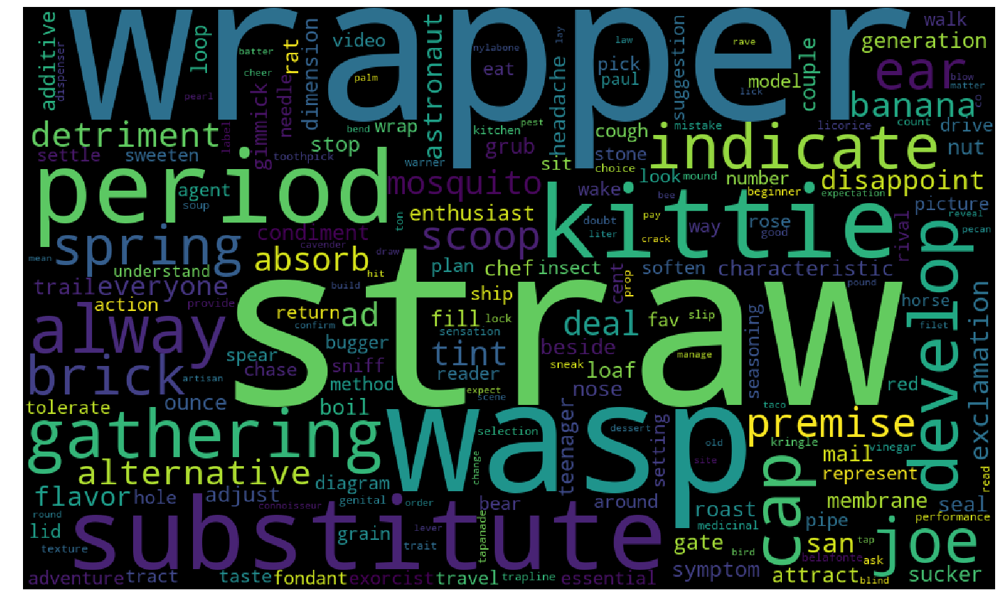

In [32]:
# Please write all the code with proper documentation
wordcloud(c1)

<Figure size 1800x1440 with 0 Axes>

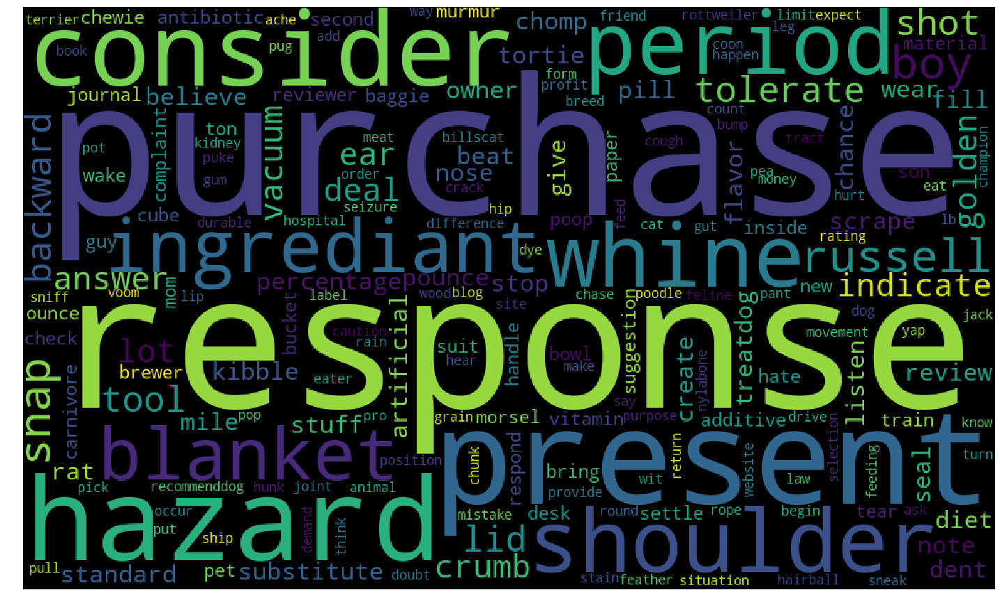

In [33]:
wordcloud(c2)

## n_cluster=5

In [34]:
from sklearn.cluster import AgglomerativeClustering
agg=AgglomerativeClustering(n_clusters=5)
agg.fit(dtfidfw2v)

AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
            connectivity=None, linkage='ward', memory=None, n_clusters=5,
            pooling_func=<function mean at 0x7f03800ccc80>)

In [35]:
c1=[]
c2=[]
c3=[]
c4=[]
c5=[]
reviewcount=agg.labels_.shape[0]
for i in range(reviewcount):
    l=agg.labels_[i]
    if l==0:
        c1.append(preprocessed_reviews[i])
    if l==1:
        c2.append(preprocessed_reviews[i])
    if l==2:
        c3.append(preprocessed_reviews[i])
    if l==3:
        c4.append(preprocessed_reviews[i])    
    else:
        c5.append(preprocessed_reviews[i])

In [36]:
print("reviews in Cluster 1 : ",len(c1))
print("reviews in Cluster 2 : ",len(c2))
print("reviews in Cluster 3 : ",len(c3))
print("reviews in Cluster 4 : ",len(c4))
print("reviews in Cluster 5 : ",len(c5))

reviews in Cluster 1 :  1178
reviews in Cluster 2 :  1270
reviews in Cluster 3 :  1935
reviews in Cluster 4 :  343
reviews in Cluster 5 :  4657


## word cloud for n_cluster=5

<Figure size 1800x1440 with 0 Axes>

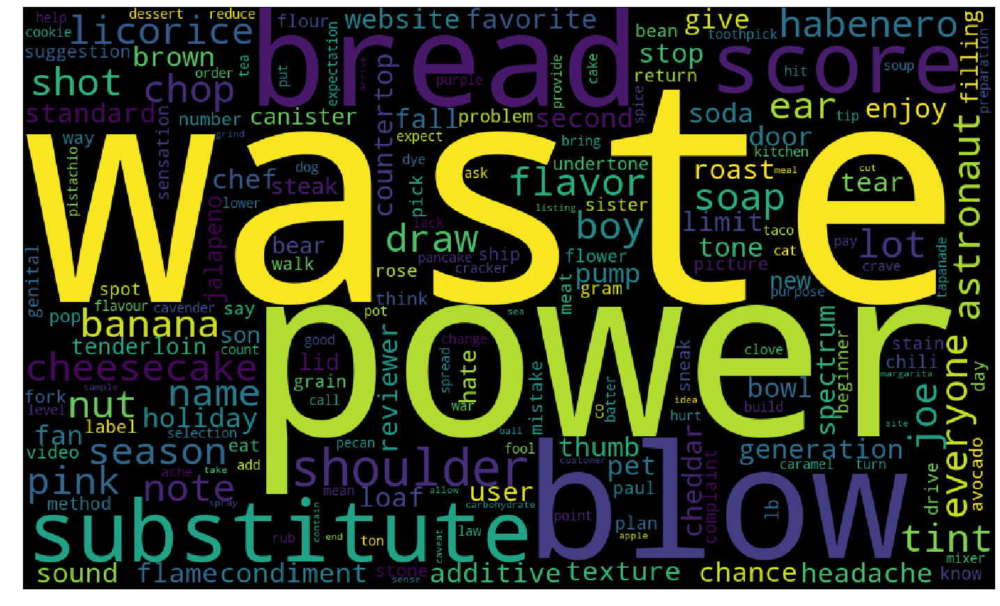

In [37]:
wordcloud(c1)

<Figure size 1800x1440 with 0 Axes>

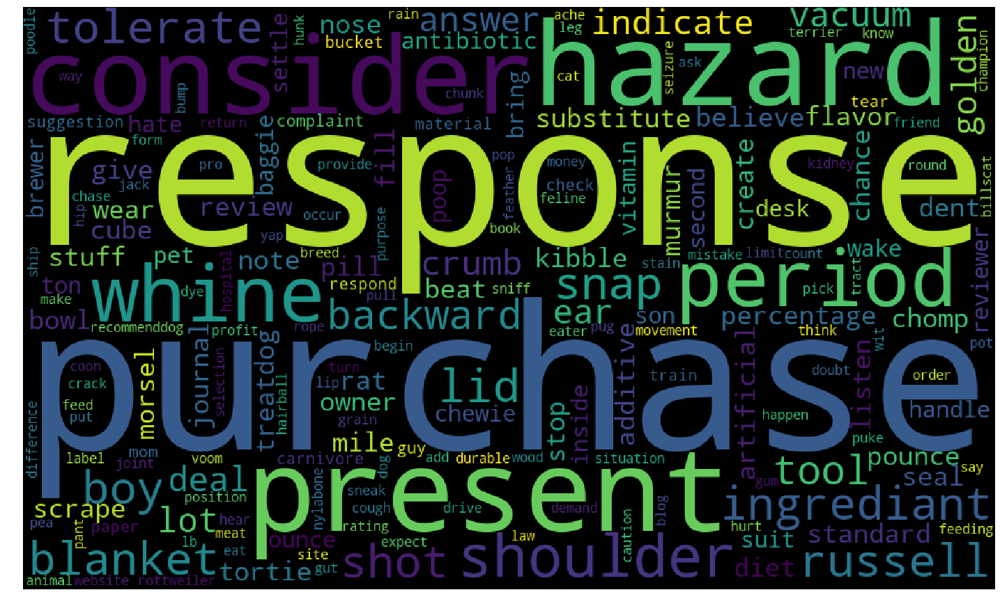

In [38]:
wordcloud(c2)

<Figure size 1800x1440 with 0 Axes>

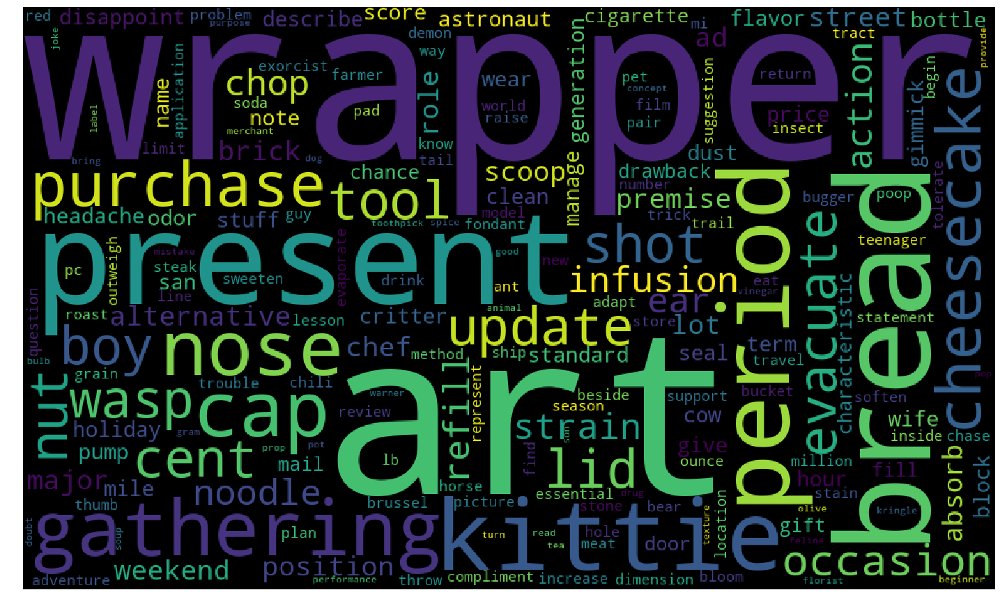

In [39]:
wordcloud(c3)

<Figure size 1800x1440 with 0 Axes>

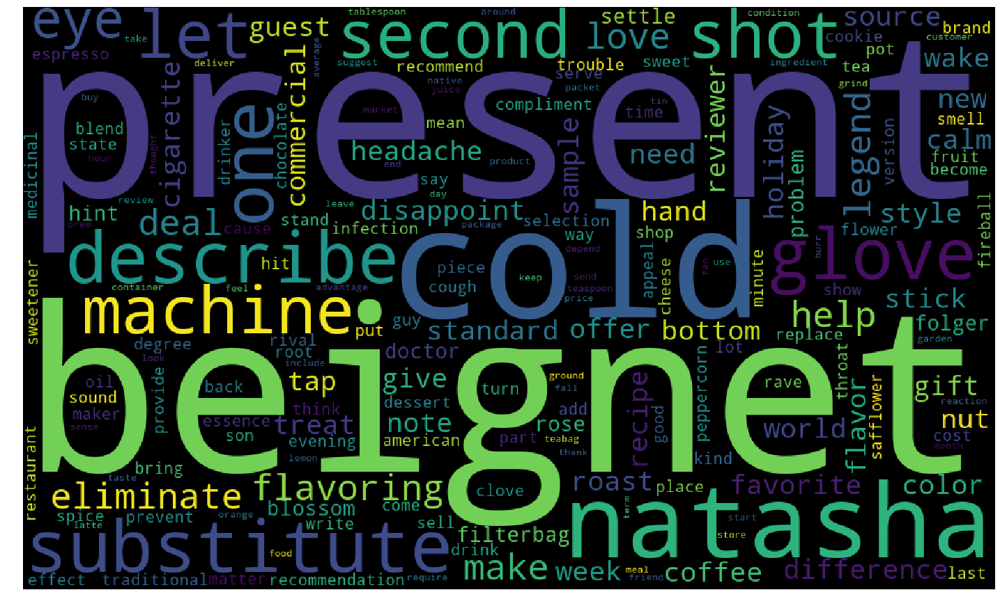

In [40]:
wordcloud(c4)

<Figure size 1800x1440 with 0 Axes>

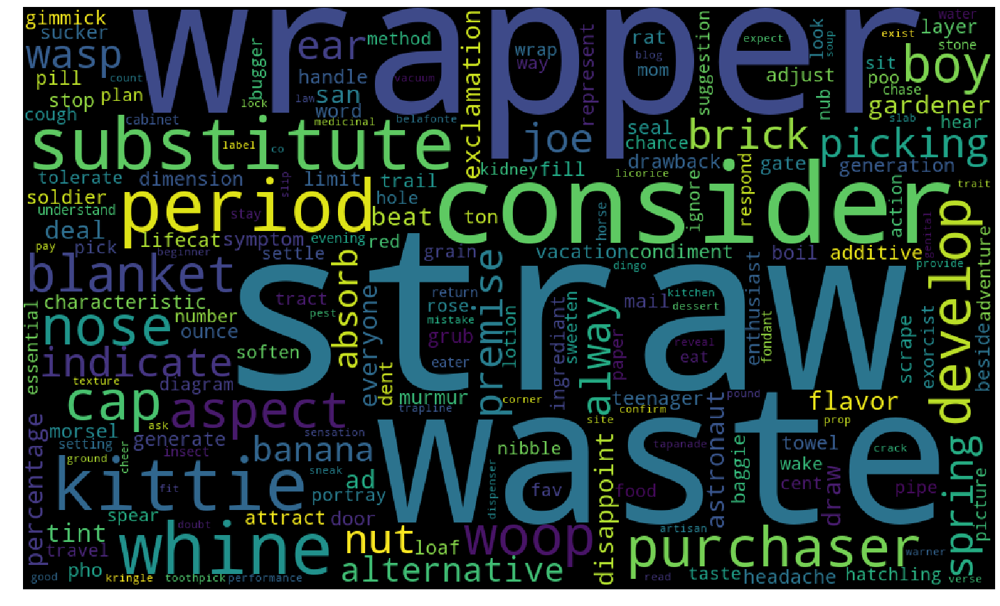

In [41]:
wordcloud(c5)

## [5.3] DBSCAN Clustering

### [5.3.1] Applying DBSCAN on AVG W2V,<font color='red'> SET 3</font>

In [42]:
# Please write all the code with proper documentation
#generally min point is 2*dimension of data. As, our dataset has 10 dimensions, so minpts=2*10
def dist(vector):
    minpts=2*10
    d=[]
    for p in vector:
        d.append(np.sort(np.sum((vector-p)**2,axis=1),axis=None)[minpts])
    return np.sqrt(np.array(d))    

## knee elbow method (plot b/w points and 20th nearest distance)

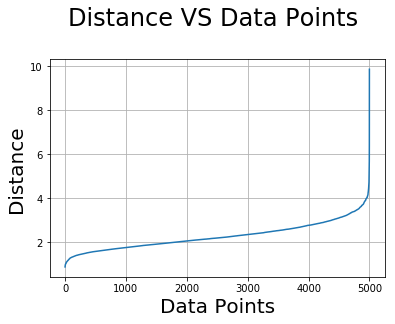

In [45]:
distance=np.sort(dist(davgw2v))
# genereting all possible point in range of the reviews
reviewcount=len(davgw2v)
dp=[]
for i in range(reviewcount):
    dp.append(i)

plt.plot(dp,distance)
plt.xlabel('Data Points',size=20)
plt.ylabel('Distance',size=20)
plt.title('Distance VS Data Points \n',size=24)
plt.grid()
plt.show()

## Optimal eps=4

In [46]:
from sklearn.cluster import DBSCAN
db=DBSCAN(eps=4,min_samples=20,n_jobs=-1)
db.fit(davgw2v)

DBSCAN(algorithm='auto', eps=4, leaf_size=30, metric='euclidean',
    metric_params=None, min_samples=20, n_jobs=-1, p=None)

In [48]:
set(db.labels_)

{-1, 0}

#### -1 represents noisy cluster 

In [49]:
reviewcount=db.labels_.shape[0]
c1=[]
noise=[]
for i in range(reviewcount):
    l=db.labels_[i]
    if(l==-1):
        noise.append(preprocessed_reviews[:5000][i])
    else :
        c1.append(preprocessed_reviews[:5000][i])

In [50]:
print("reviews in Cluster 1 : ",len(c1))
print("Noisy Reviews : ",len(noise))

reviews in Cluster 1 :  4993
Noisy Reviews :  7


### [5.3.2] Wordclouds of clusters obtained after applying DBSCAN on AVG W2V<font color='red'> SET 3</font>

<Figure size 1800x1440 with 0 Axes>

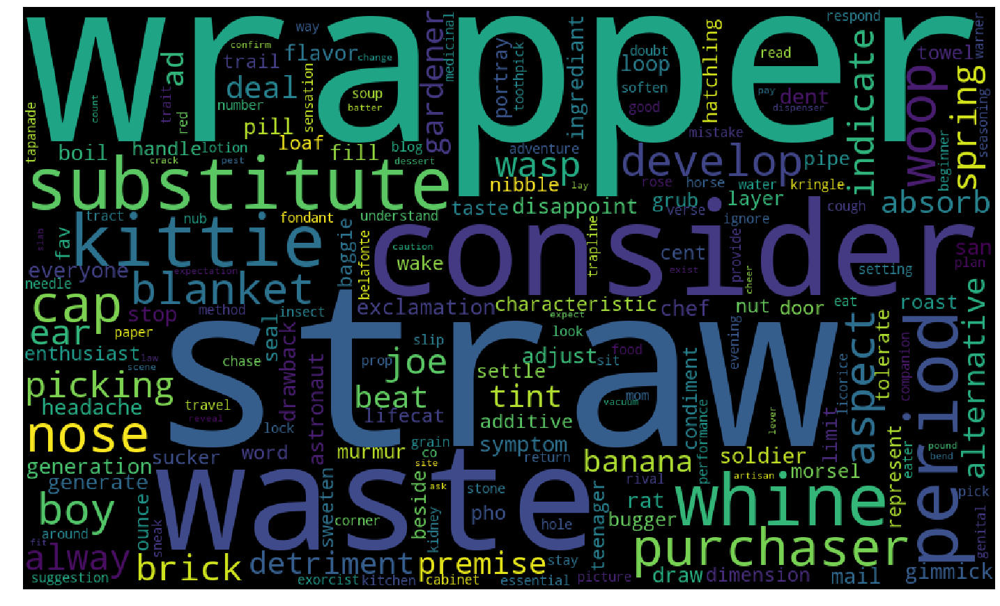

In [51]:
# Please write all the code with proper documentation
wordcloud(c1)

### wordcloud of noise

<Figure size 1800x1440 with 0 Axes>

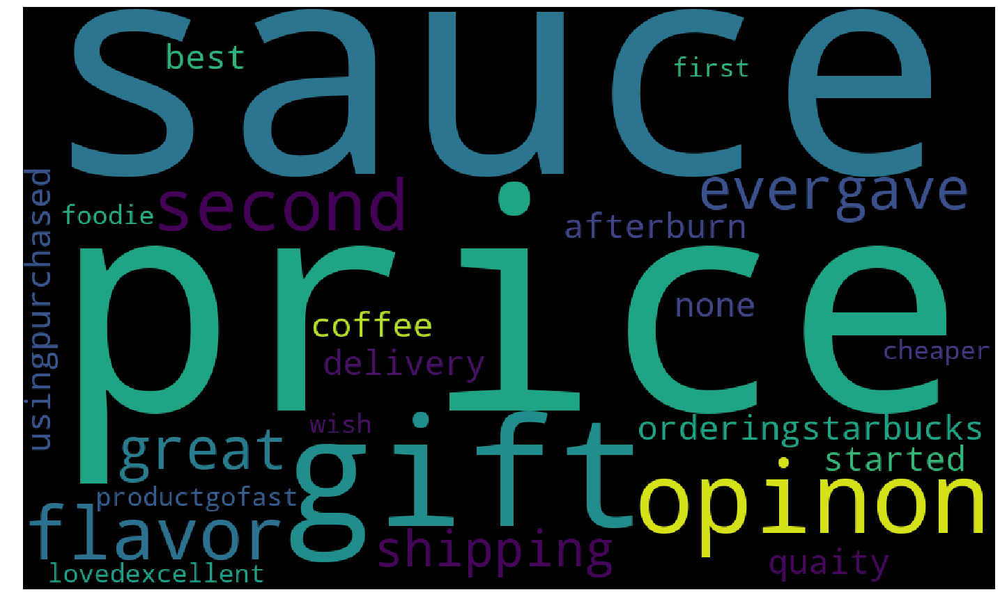

In [52]:
wordcloud(noise)

### [5.3.3] Applying DBSCAN on TFIDF W2V,<font color='red'> SET 4</font>

## Knee elbow method to find eps

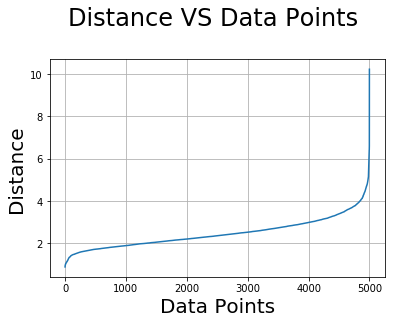

In [53]:
# Please write all the code with proper documentation
distance=np.sort(dist(dtfidfw2v))
# genereting all possible point in range of the reviews
reviewcount=len(dtfidfw2v)
dp=[]
for i in range(reviewcount):
    dp.append(i)

plt.plot(dp,distance)
plt.xlabel('Data Points',size=20)
plt.ylabel('Distance',size=20)
plt.title('Distance VS Data Points \n',size=24)
plt.grid()
plt.show()

## Best EPS=4

In [54]:
from sklearn.cluster import DBSCAN
db=DBSCAN(eps=4,min_samples=20,n_jobs=-1)
db.fit(dtfidfw2v)

DBSCAN(algorithm='auto', eps=4, leaf_size=30, metric='euclidean',
    metric_params=None, min_samples=20, n_jobs=-1, p=None)

In [55]:
set(db.labels_)

{-1, 0}

In [56]:
reviewcount=db.labels_.shape[0]
c1=[]
noise=[]
for i in range(reviewcount):
    l=db.labels_[i]
    if(l==-1):
        noise.append(preprocessed_reviews[:5000][i])
    else :
        c1.append(preprocessed_reviews[:5000][i])

In [57]:
print("reviews in Cluster 1 : ",len(c1))
print("Noisy Reviews : ",len(noise))

reviews in Cluster 1 :  4981
Noisy Reviews :  19


### [5.3.4] Wordclouds of clusters obtained after applying DBSCAN on TFIDF W2V<font color='red'> SET 4</font>

## Wordcloud for cluster 1

<Figure size 1800x1440 with 0 Axes>

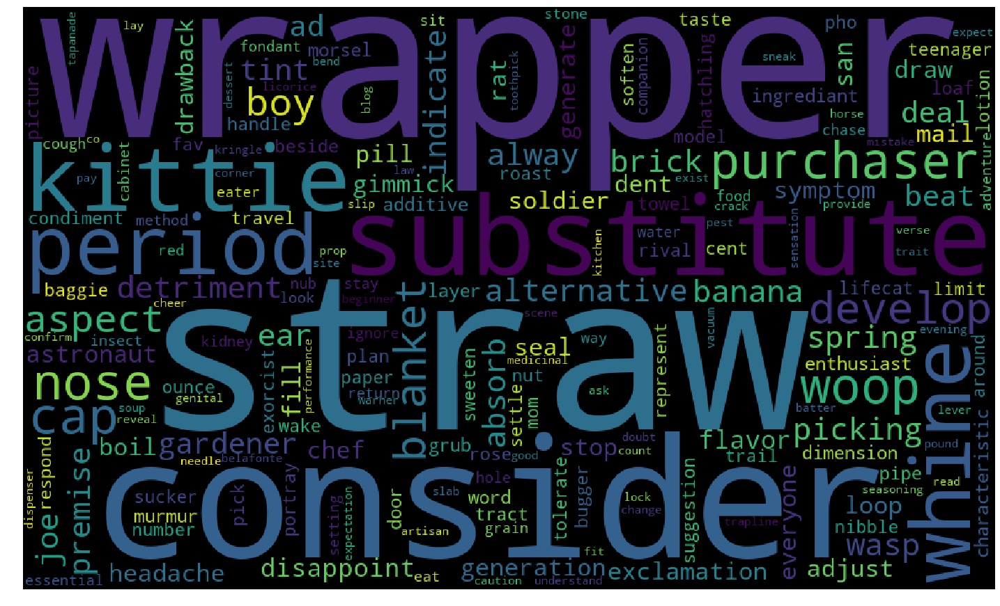

In [58]:
wordcloud(c1)

## word cloud for noisy cluster

<Figure size 1800x1440 with 0 Axes>

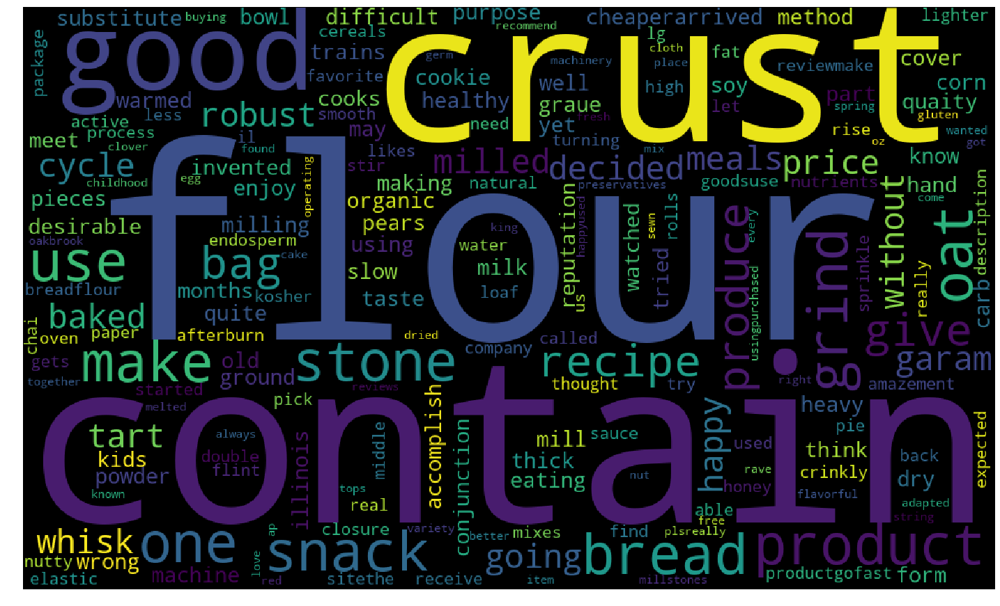

In [59]:
wordcloud(noise)

# [6] Conclusions

### K-Means

In [35]:
# Please compare all your models using Prettytable library. 
# You can have 3 tables, one each for kmeans, agllomerative and dbscan
from prettytable import PrettyTable
x = PrettyTable()
#adding Field names
x.field_names = ["Vectorizer","No of Cluster"]
# adding row to table
x.add_row(["BOW",3])
x.add_row(["TF-IDF",8])
x.add_row(["AVG-W2VEC",4])
x.add_row(["TFIDF-W2VEC",3])
#printing the table
print(x)


+-------------+---------------+
|  Vectorizer | No of Cluster |
+-------------+---------------+
|     BOW     |       3       |
|    TF-IDF   |       8       |
|  AVG-W2VEC  |       4       |
| TFIDF-W2VEC |       3       |
+-------------+---------------+


### Agglomerative Clustering

In [6]:
from prettytable import PrettyTable
x = PrettyTable()
#adding Field names
x.field_names = ["Vectorizer","No of Cluster"]
# adding row to table
x.add_row(["AVG-W2VEC",2])
x.add_row(["TFIDF-W2VEC",2])
#printing the table
print(x)


+-------------+---------------+
|  Vectorizer | No of Cluster |
+-------------+---------------+
|  AVG-W2VEC  |       2       |
| TFIDF-W2VEC |       2       |
+-------------+---------------+


### DBSCAN Clustering

In [62]:
x = PrettyTable()
#adding Field names
x.field_names = ["Vectorizer","Best EPS"]
# adding row to table
x.add_row(["AVG-W2VEC",4])
x.add_row(["TFIDF-W2VEC",4])
#printing the table
print(x)


+-------------+----------+
|  Vectorizer | Best EPS |
+-------------+----------+
|  AVG-W2VEC  |    4     |
| TFIDF-W2VEC |    4     |
+-------------+----------+


## K-Means Clustering

Kmeans Clustering works well and divided the reviews into clusters in range 3 to 8. It gives very good result and there are some words which are common in these clusters like: Reseller, carbohydrate, replacement, Horror. 
Talking about Kmeans on Bag Of word vector, It creates 3 clusters which differentiate each other properly.

## Agglomerative Clustering

In Aggomerative clustering, we have tested with cluster size of 2 and 5, of which cluster size=2 works well because it divides cluster in such a way that first cluster contains words that are positive about product and also the products name.
The second cluster contains negative words about product and describing words about product like "waste".

## DBSCAN

DBSCAN clusters divide the reviews according to density, so it only divide reviews into 2 clusters and separate noise from the reviews. It is not useful for this type of data because, we wanted to divide it into meaningful clusters.